<a href="https://colab.research.google.com/github/tarini-py/Aerofit-Case-Study/blob/main/Aerofit_Case_Study.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Problem Statement:**


---







The market research team at AeroFit wants to identify the characteristics of the target audience for each type of treadmill offered by the company, to provide a better recommendation of the treadmills to the new customers. The team decides to investigate whether there are differences across the product with respect to customer characteristics.


1.   Perform descriptive analytics to create a customer profile for each  AeroFit treadmill product by developing appropriate tables and charts
2. For each AeroFit treadmill product, construct two-way contingency tables and compute all conditional and marginal probabilities along with their insights/impact on the business.



KP281 - entry-level - $1,500

KP481 - mid-level - $1,750

KP781 - advanced - $2,500.

https://colab.research.google.com/drive/1lLRoFSeiAxdZq1pYepIQaSTf09kFY_fv?usp=sharing

#1. Import required Libraies


---



In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
import itertools
import math
warnings.filterwarnings('ignore')

In [ ]:
palette = [

    "#ff7f0e",
    "#1f77b4",
    "#2ca02c",
    "#d62728",
    "#9467bd",
    "#8c564b",
    "#e377c2",
    "#7f7f7f",
    "#bcbd22",
    "#17becf",
    "#4d4d4d"
]
sns.set_theme(style='darkgrid', palette=palette)


# 2. Load Dataset


---



In [ ]:
df=pd.read_csv('https://d2beiqkhq929f0.cloudfront.net/public_assets/assets/000/001/125/original/aerofit_treadmill.csv')
bak=df.copy(deep=True)

In [ ]:
np.shares_memory(df,bak)

False

# 3. Basic Data Analyis


---



In [ ]:
df.head(3)

,Product,Age,Gender,Education,MaritalStatus,Usage,Fitness,Income,Miles
0,KP281,18,Male,14,Single,3,4,29562,112
1,KP281,19,Male,15,Single,2,3,31836,75
2,KP281,19,Female,14,Partnered,4,3,30699,66


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 180 entries, 0 to 179
Data columns (total 9 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   Product        180 non-null    object
 1   Age            180 non-null    int64 
 2   Gender         180 non-null    object
 3   Education      180 non-null    int64 
 4   MaritalStatus  180 non-null    object
 5   Usage          180 non-null    int64 
 6   Fitness        180 non-null    int64 
 7   Income         180 non-null    int64 
 8   Miles          180 non-null    int64 
dtypes: int64(6), object(3)
memory usage: 12.8+ KB


In [ ]:
df.shape

(180, 9)

In [ ]:
df.describe()

,Age,Education,Usage,Fitness,Income,Miles
count,180.000000,180.000000,180.000000,180.000000,180.000000,180.000000
mean,28.788889,15.572222,3.455556,3.311111,53719.577778,103.194444
std,6.943498,1.617055,1.084797,0.958869,16506.684226,51.863605
min,18.000000,12.000000,2.000000,1.000000,29562.000000,21.000000
25%,24.000000,14.000000,3.000000,3.000000,44058.750000,66.000000
50%,26.000000,16.000000,3.000000,3.000000,50596.500000,94.000000
75%,33.000000,16.000000,4.000000,4.000000,58668.000000,114.750000
max,50.000000,21.000000,7.000000,5.000000,104581.000000,360.000000


In [ ]:
df.columns

Index(['Product', 'Age', 'Gender', 'Education', 'MaritalStatus', 'Usage',
       'Fitness', 'Income', 'Miles'],
      dtype='object')

In [ ]:
df.duplicated().sum()

np.int64(0)

In [ ]:
df.nunique()

,0
Product,3
Age,32
Gender,2
Education,8
MaritalStatus,2
Usage,6
Fitness,5
Income,62
Miles,37


# 4. Exploration


---



In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 180 entries, 0 to 179
Data columns (total 9 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   Product        180 non-null    object
 1   Age            180 non-null    int64 
 2   Gender         180 non-null    object
 3   Education      180 non-null    int64 
 4   MaritalStatus  180 non-null    object
 5   Usage          180 non-null    int64 
 6   Fitness        180 non-null    int64 
 7   Income         180 non-null    int64 
 8   Miles          180 non-null    int64 
dtypes: int64(6), object(3)
memory usage: 12.8+ KB


In [ ]:
df.columns

Index(['Product', 'Age', 'Gender', 'Education', 'MaritalStatus', 'Usage',
       'Fitness', 'Income', 'Miles'],
      dtype='object')

## Univariate Analysis

###*Product*

In [ ]:
df['Product'].value_counts()

,count
Product,
KP281,80
KP481,60
KP781,40


In [ ]:
df['Product'].value_counts(normalize=True)*100

,proportion
Product,
KP281,44.444444
KP481,33.333333
KP781,22.222222


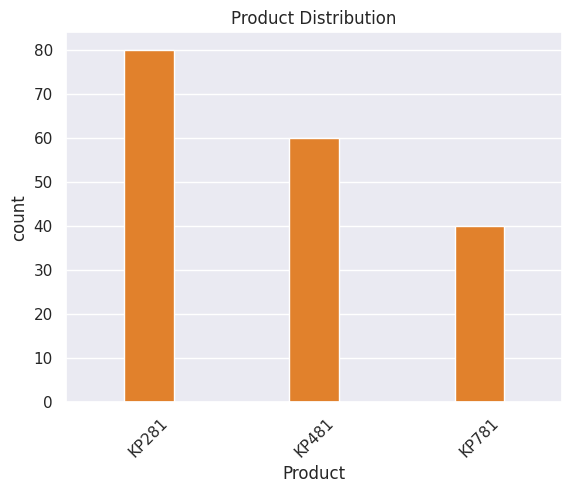

In [ ]:
sns.countplot(x = df["Product"], width=0.3)
plt.xticks(rotation=45)
plt.title("Product Distribution")
plt.show()

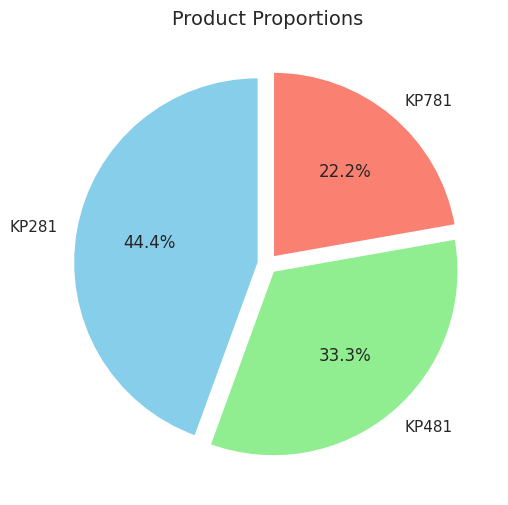

In [ ]:
proportions = df['Product'].value_counts(normalize=True) * 100
labels = proportions.index

plt.figure(figsize=(6,6))
plt.pie(proportions, labels=labels, autopct="%.1f%%", startangle=90,
        colors=["skyblue", "lightgreen", "salmon"], explode=[0.05]*len(proportions))

plt.title("Product Proportions", fontsize=14)
plt.show()

KP281 dominates with the largest share (44.44%).

KP481 is second with one-third of the total.

KP781 is smallest, about one-fifth.

###*Age*

In [ ]:
col='Age'

In [ ]:
df['Age'].min(), df['Age'].max()

(18, 50)

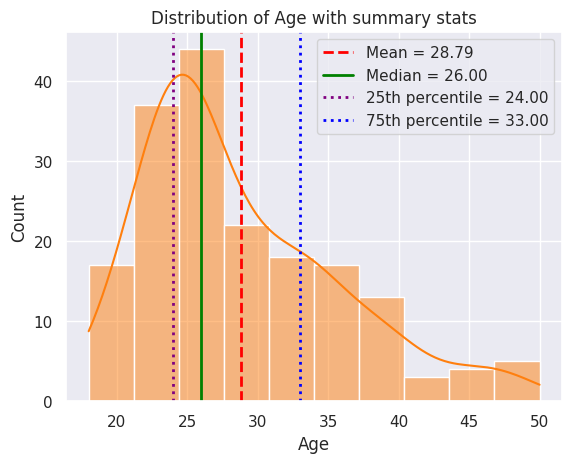

In [ ]:
sns.histplot(data=df, x=col, bins=10, kde=True)
plt.axvline(df[col].mean(), color='red', linestyle='--', linewidth=2, label=f"Mean = {df[col].mean():.2f}")
plt.axvline(df[col].median(), color='green', linestyle='-', linewidth=2, label=f"Median = {df[col].median():.2f}")
plt.axvline(df[col].quantile(0.25), color='purple', linestyle=':', linewidth=2, label=f"25th percentile = {df[col].quantile(0.25):.2f}")
plt.axvline(df[col].quantile(0.75), color='blue', linestyle=':', linewidth=2, label=f"75th percentile = {df[col].quantile(0.75):.2f}")
plt.legend()
plt.title(f"Distribution of {col} with summary stats")
plt.show()

In [ ]:
bins=[17,20,30,40,50]
labels=['Teens','20s-29s','30s-39s','40s & above']
df['Age_Group']=pd.cut(df['Age'],bins=bins,labels=labels,include_lowest=True)

In [ ]:
df['Age_Group'].value_counts(normalize=True)*100

,proportion
Age_Group,
20s-29s,61.111111
30s-39s,26.666667
40s & above,6.666667
Teens,5.555556


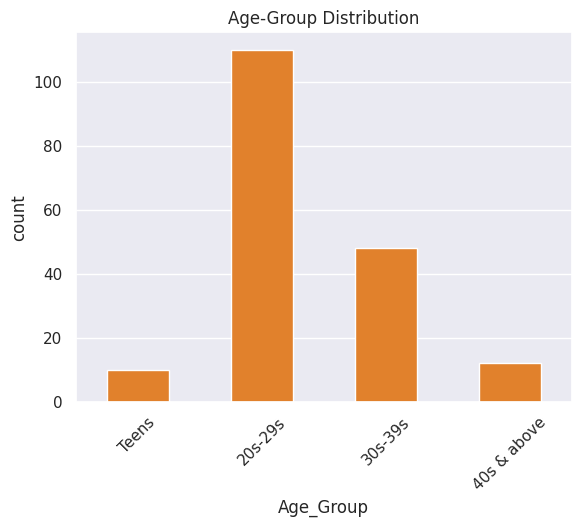

In [ ]:
sns.countplot(x = df["Age_Group"], width=0.5)
plt.xticks(rotation=45)
plt.title("Age-Group Distribution")
plt.show()

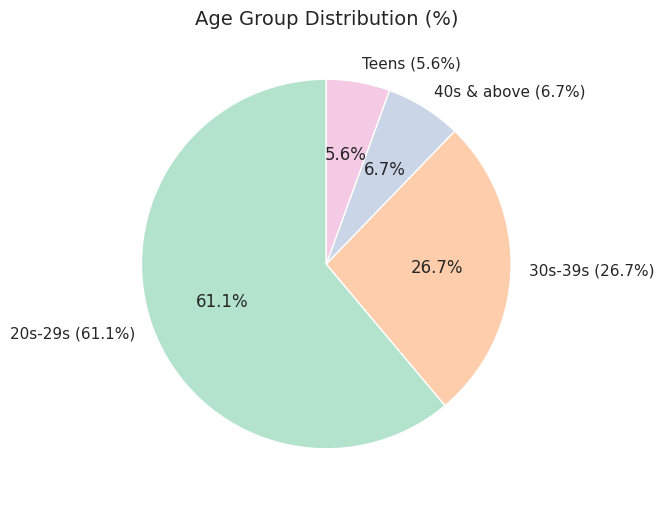

In [ ]:

age_prop = df['Age_Group'].value_counts(normalize=True) * 100

labels = [f"{idx} ({val:.1f}%)" for idx, val in age_prop.items()]


plt.figure(figsize=(6,6))
plt.pie(
    age_prop,
    labels=labels,
    autopct='%1.1f%%',
    startangle=90,
    colors=plt.cm.Pastel2.colors
)

plt.title("Age Group Distribution (%)", fontsize=14)
plt.show()


In [ ]:
df['Age'].describe()

,Age
count,180.000000
mean,28.788889
std,6.943498
min,18.000000
25%,24.000000
50%,26.000000
75%,33.000000
max,50.000000


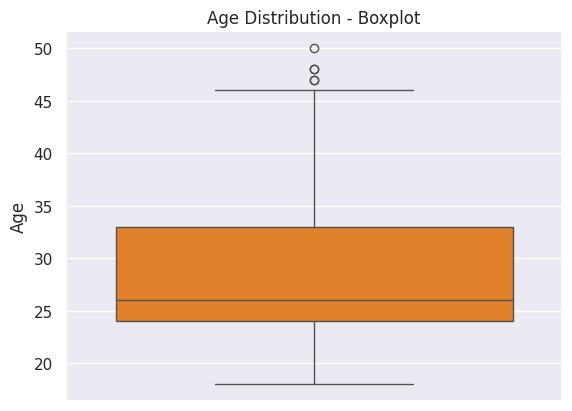

In [ ]:
sns.boxplot(y=df['Age'])
plt.title("Age Distribution - Boxplot")
plt.show()

### *Gender*

In [ ]:
df['Gender'].value_counts(normalize=True)*100

,proportion
Gender,
Male,57.777778
Female,42.222222


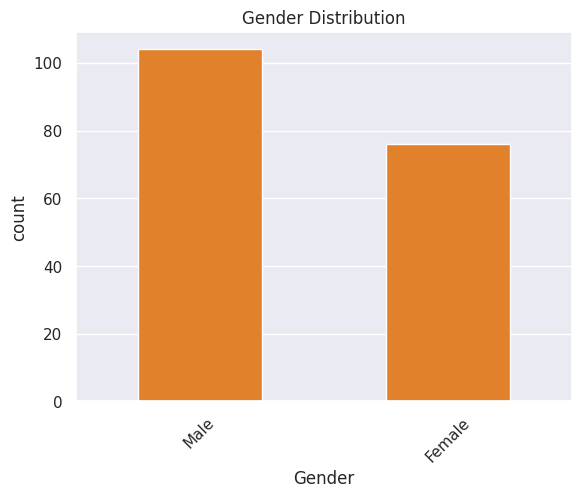

In [ ]:
sns.countplot(x = df["Gender"], width=0.5)
plt.xticks(rotation=45)
plt.title("Gender Distribution")
plt.show()

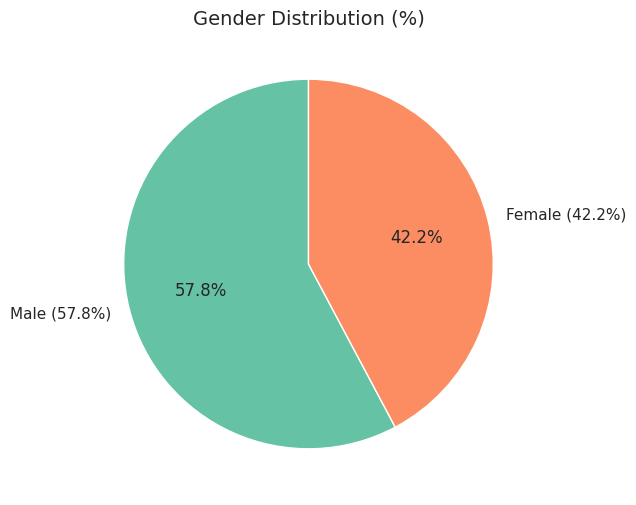

In [ ]:

gender_prop = df['Gender'].value_counts(normalize=True) * 100

labels = [f"{idx} ({val:.1f}%)" for idx, val in gender_prop.items()]


plt.figure(figsize=(6,6))
plt.pie(
    gender_prop,
    labels=labels,
    autopct='%1.1f%%',
    startangle=90,
    colors=plt.cm.Set2.colors
)

plt.title("Gender Distribution (%)", fontsize=14)
plt.show()


### *Education*

In [ ]:
df['Education'].min(), df['Education'].max()

(12, 21)

In [ ]:
df['Education'].value_counts()

,count
Education,
16,85
14,55
18,23
15,5
13,5
12,3
21,3
20,1


In [ ]:
df['Education'].value_counts(normalize=True)*100

,proportion
Education,
16,47.222222
14,30.555556
18,12.777778
15,2.777778
13,2.777778
12,1.666667
21,1.666667
20,0.555556


In [ ]:
df['Education'].describe()

,Education
count,180.000000
mean,15.572222
std,1.617055
min,12.000000
25%,14.000000
50%,16.000000
75%,16.000000
max,21.000000


Min = 12 years → equivalent to High School graduate.

25% = 14 years → some college / diploma level.

50% (Median) = 16 years → typically a Bachelor’s degree.

75% = 16 years (again) → majority concentrated around Bachelor’s.

Max = 21 years → corresponds to Doctorate / Professional degree.

Std Dev ≈ 1.62 → very low variation, meaning most people cluster around 15–16 years.

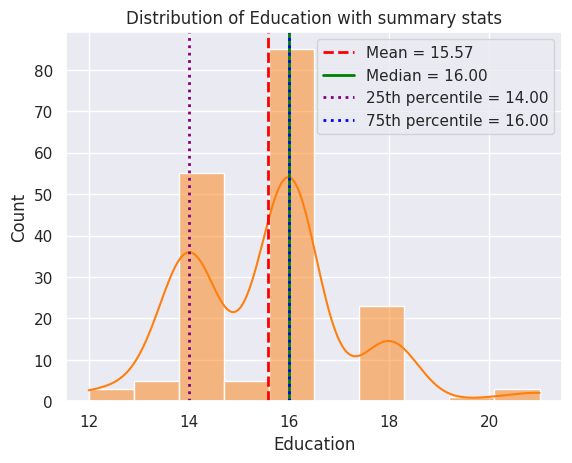

In [ ]:
col='Education'
sns.histplot(data=df, x=col, bins=10, kde=True)
plt.axvline(df[col].mean(), color='red', linestyle='--', linewidth=2, label=f"Mean = {df[col].mean():.2f}")
plt.axvline(df[col].median(), color='green', linestyle='-', linewidth=2, label=f"Median = {df[col].median():.2f}")
plt.axvline(df[col].quantile(0.25), color='purple', linestyle=':', linewidth=2, label=f"25th percentile = {df[col].quantile(0.25):.2f}")
plt.axvline(df[col].quantile(0.75), color='blue', linestyle=':', linewidth=2, label=f"75th percentile = {df[col].quantile(0.75):.2f}")
plt.legend()
plt.title(f"Distribution of {col} with summary stats")
plt.show()

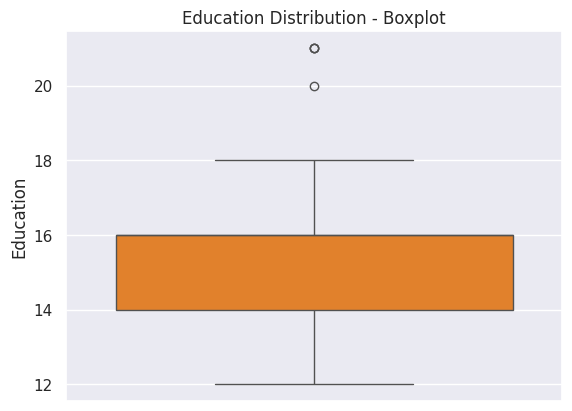

In [ ]:
sns.boxplot(y=df['Education'])
plt.title("Education Distribution - Boxplot")
plt.show()

Years of Education	Category

12–13	High School

14–16	Bachelor’s / Undergraduate

17–18	Master’s / Graduate

19–21	Doctorate / Professional

In [ ]:
def categorize_education(years):
    if years <= 13:
        return "High School"
    elif years <= 16:
        return "Bachelor's"
    elif years <= 18:
        return "Master's"
    else:
        return "Doctorate/Professional"

df['Education_Level'] = df['Education'].apply(categorize_education)
df['Education_Level'].value_counts()

,count
Education_Level,
Bachelor's,145
Master's,23
High School,8
Doctorate/Professional,4


In [ ]:
df['Education_Level'].value_counts(normalize=True)*100

,proportion
Education_Level,
Bachelor's,80.555556
Master's,12.777778
High School,4.444444
Doctorate/Professional,2.222222


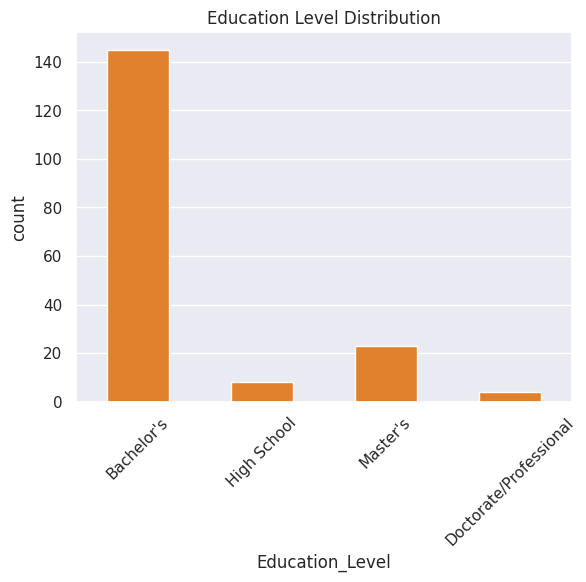

In [ ]:
sns.countplot(x = df["Education_Level"], width=0.5)
plt.xticks(rotation=45)
plt.title("Education Level Distribution")
plt.show()

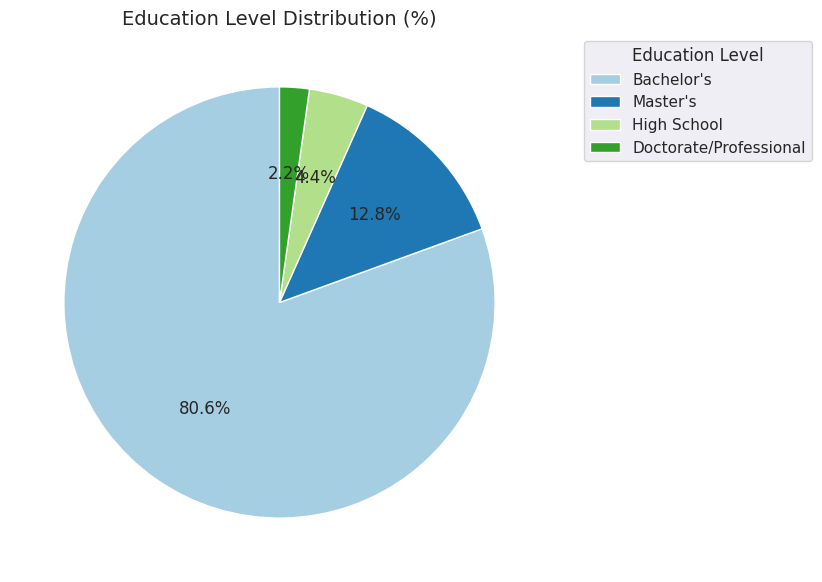

In [ ]:

edu_prop = df['Education_Level'].value_counts(normalize=True) * 100

labels = [f"{idx} ({val:.1f}%)" for idx, val in edu_prop.items()]



plt.figure(figsize=(7,7))
plt.pie(
    edu_prop,
    autopct='%1.1f%%',
    startangle=90,
    colors=plt.cm.Paired.colors
)

plt.legend(
    edu_prop.index,
    title="Education Level",
    bbox_to_anchor=(1.05, 1), loc="upper left"
)

plt.title("Education Level Distribution (%)", fontsize=14)
plt.show()


###*Marital Status*

In [ ]:
df['MaritalStatus'].value_counts()

,count
MaritalStatus,
Partnered,107
Single,73


In [ ]:
df['MaritalStatus'].value_counts(normalize=True)*100

,proportion
MaritalStatus,
Partnered,59.444444
Single,40.555556


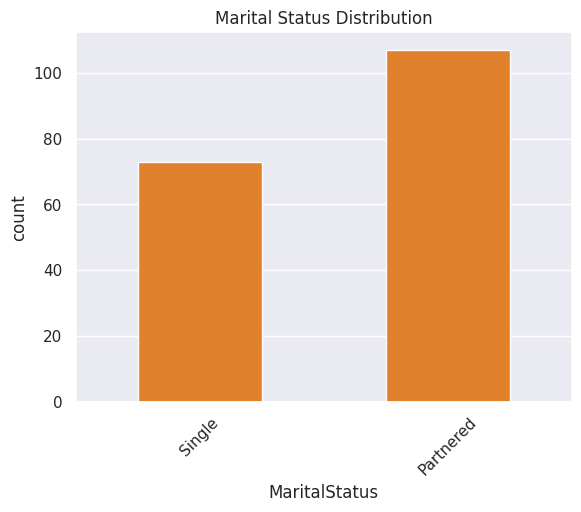

In [ ]:
sns.countplot(x = df["MaritalStatus"], width=0.5)
plt.xticks(rotation=45)
plt.title("Marital Status Distribution")
plt.show()

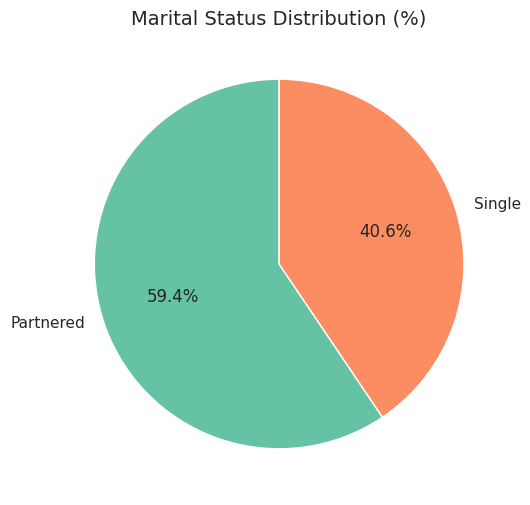

In [ ]:

marital_prop = df['MaritalStatus'].value_counts(normalize=True) * 100

plt.figure(figsize=(6,6))
plt.pie(
    marital_prop,
    labels=marital_prop.index,
    autopct='%1.1f%%',
    startangle=90,
    colors=plt.cm.Set2.colors
)

plt.title("Marital Status Distribution (%)", fontsize=14)
plt.show()


### *Usage*

In [ ]:
df['Usage'].min(), df['Usage'].max()

(2, 7)

In [ ]:
df['Usage'].value_counts()

,count
Usage,
3,69
4,52
2,33
5,17
6,7
7,2


**Insights from Usage Distribution**

Most common usage is 3 days/week (69 users, ~38%)

Next is 4 days/week (52 users, ~29%)

Together, 3–4 days/week = 67% of customers → the majority use treadmills at a moderate frequency.

Lower usage (2 days/week = 33 users, ~18%) → some customers are less engaged.

Higher usage (5–7 days/week = 26 users, ~15%) → only a small but committed group uses it intensively.

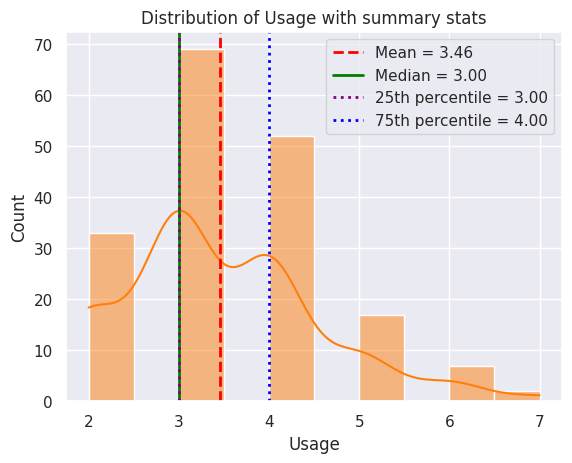

In [ ]:
col='Usage'
sns.histplot(data=df, x=col, bins=10, kde=True)
plt.axvline(df[col].mean(), color='red', linestyle='--', linewidth=2, label=f"Mean = {df[col].mean():.2f}")
plt.axvline(df[col].median(), color='green', linestyle='-', linewidth=2, label=f"Median = {df[col].median():.2f}")
plt.axvline(df[col].quantile(0.25), color='purple', linestyle=':', linewidth=2, label=f"25th percentile = {df[col].quantile(0.25):.2f}")
plt.axvline(df[col].quantile(0.75), color='blue', linestyle=':', linewidth=2, label=f"75th percentile = {df[col].quantile(0.75):.2f}")
plt.legend()
plt.title(f"Distribution of {col} with summary stats")
plt.show()

In [ ]:
df['Usage'].describe()

,Usage
count,180.000000
mean,3.455556
std,1.084797
min,2.000000
25%,3.000000
50%,3.000000
75%,4.000000
max,7.000000


Mean = 3.46 days/week → on average, users use the treadmill about 3–4 times per week.

Std Dev = 1.08 → relatively low variation → most users cluster around 3–4 days/week.

Min = 2 days/week → nobody uses it less than 2 days

25th percentile = 3 days/week → at least 25% of users use 3 days/week or less.

Median (50th percentile) = 3 days/week → half of users use it 3 days or less.

75th percentile = 4 days/week → 75% of users use it ≤ 4 days/week.

Max = 7 days/week → very few heavy users (daily usage)

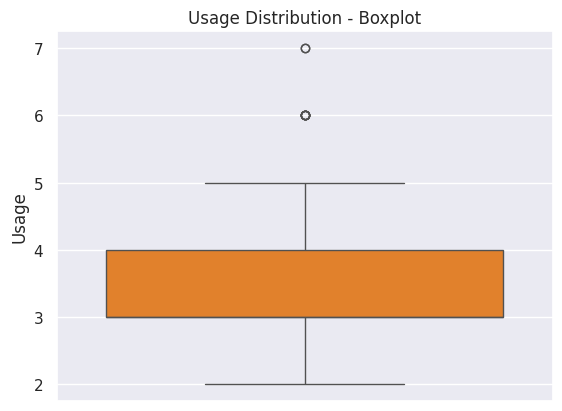

In [ ]:
sns.boxplot(y=df['Usage'])
plt.title("Usage Distribution - Boxplot")
plt.show()

In [ ]:
bins=[0, 2, 4, 7]
labels=["Light", "Moderate", "Heavy"]
df["Usage_Category"] = pd.cut(df["Usage"], bins=bins, labels=labels)
df["Usage_Category"].value_counts()

,count
Usage_Category,
Moderate,121
Light,33
Heavy,26


In [ ]:
df["Usage_Category"].value_counts(normalize=True)*100

,proportion
Usage_Category,
Moderate,67.222222
Light,18.333333
Heavy,14.444444


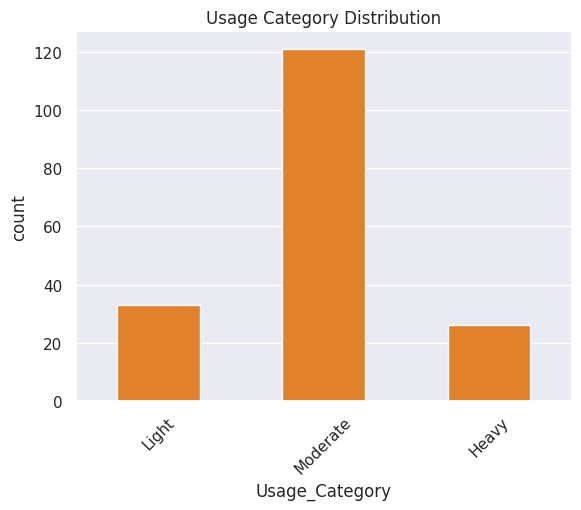

In [ ]:
sns.countplot(x = df["Usage_Category"], width=0.5)
plt.xticks(rotation=45)
plt.title("Usage Category Distribution")
plt.show()

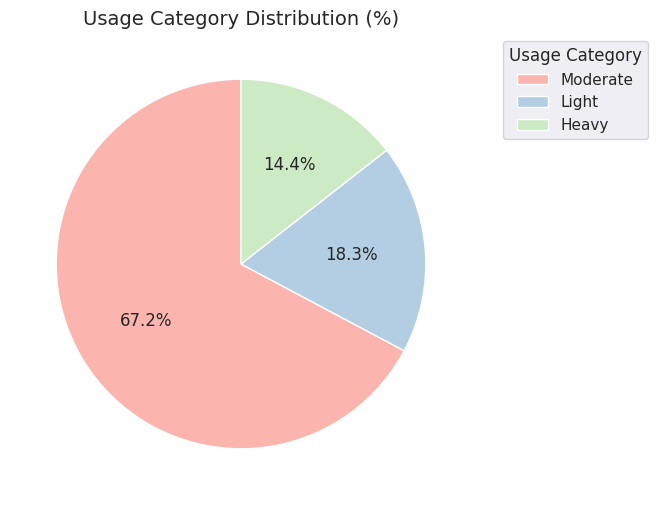

In [ ]:

usage_prop = df["Usage_Category"].value_counts(normalize=True) * 100

plt.figure(figsize=(6,6))
plt.pie(
    usage_prop,
    autopct='%1.1f%%',
    startangle=90,
    colors=plt.cm.Pastel1.colors
)

plt.legend(
    usage_prop.index,
    title="Usage Category",
    bbox_to_anchor=(1.05, 1),
    loc="upper left"
)

plt.title("Usage Category Distribution (%)", fontsize=14)
plt.show()


###*Fitness*

In [ ]:
df['Fitness'].min(), df['Fitness'].max()

(1, 5)

In [ ]:
df['Fitness'].value_counts()

,count
Fitness,
3,97
5,31
2,26
4,24
1,2


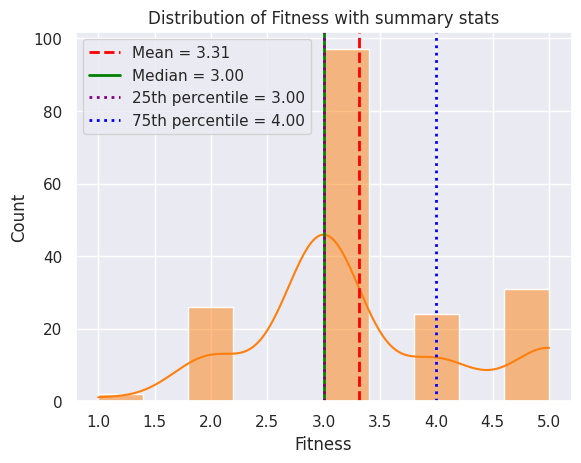

In [ ]:
col='Fitness'
sns.histplot(data=df, x=col, bins=10, kde=True)
plt.axvline(df[col].mean(), color='red', linestyle='--', linewidth=2, label=f"Mean = {df[col].mean():.2f}")
plt.axvline(df[col].median(), color='green', linestyle='-', linewidth=2, label=f"Median = {df[col].median():.2f}")
plt.axvline(df[col].quantile(0.25), color='purple', linestyle=':', linewidth=2, label=f"25th percentile = {df[col].quantile(0.25):.2f}")
plt.axvline(df[col].quantile(0.75), color='blue', linestyle=':', linewidth=2, label=f"75th percentile = {df[col].quantile(0.75):.2f}")
plt.legend()
plt.title(f"Distribution of {col} with summary stats")
plt.show()

In [ ]:
df['Fitness'].describe()

,Fitness
count,180.000000
mean,3.311111
std,0.958869
min,1.000000
25%,3.000000
50%,3.000000
75%,4.000000
max,5.000000


Center:

Mean ≈ 3.31 → slightly above average fitness level.

Median = 3 → most users rate themselves as moderately fit.

Spread:

Std = 0.96 → fairly tight distribution, most people cluster around 3–4.

25% at 3, 75% at 4 → 50% of customers are between 3 and 4.

Extremes:

Few customers rate as 1 (very low fitness) or 5 (very high fitness).

Indicates target customers are generally moderately fit individuals.

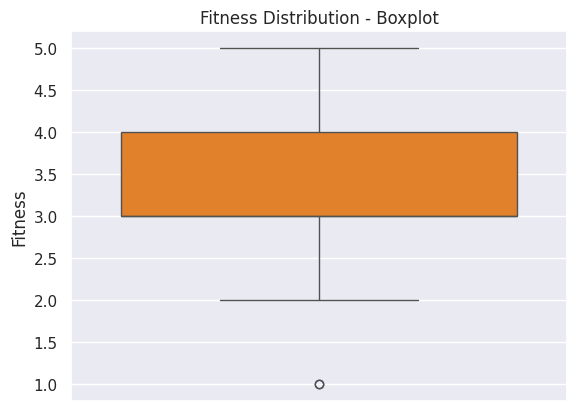

In [ ]:
sns.boxplot(y=df['Fitness'])
plt.title("Fitness Distribution - Boxplot")
plt.show()

In [ ]:
bins=[0, 2, 3, 5]
labels=["Low", "Moderate", "High"]
df["Fitness_Category"] = pd.cut(df["Fitness"], bins=bins, labels=labels)
df["Fitness_Category"].value_counts()

,count
Fitness_Category,
Moderate,97
High,55
Low,28


In [ ]:
df['Fitness_Category'].value_counts(normalize=True)*100

,proportion
Fitness_Category,
Moderate,53.888889
High,30.555556
Low,15.555556


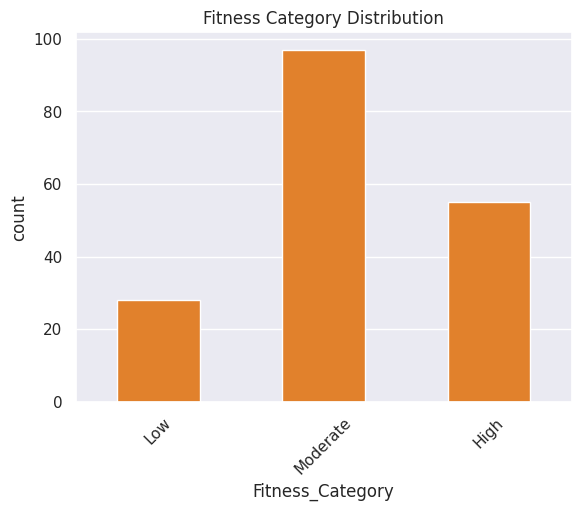

In [ ]:
sns.countplot(x = df["Fitness_Category"], width=0.5)
plt.xticks(rotation=45)
plt.title("Fitness Category Distribution")
plt.show()

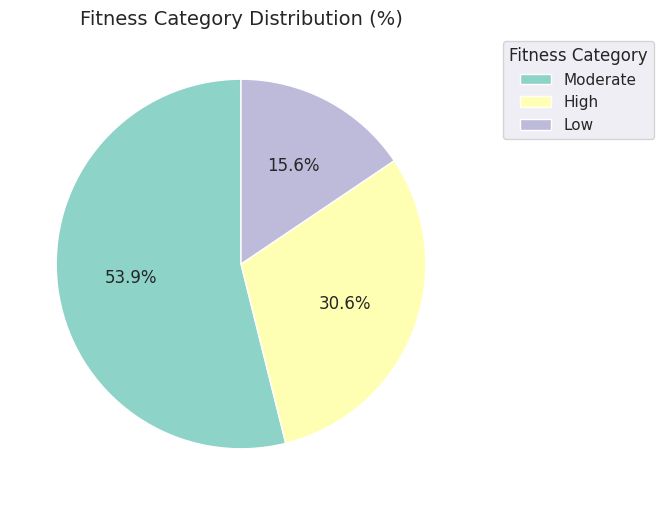

In [ ]:
fitness_prop = df["Fitness_Category"].value_counts(normalize=True) * 100

plt.figure(figsize=(6,6))
plt.pie(
    fitness_prop,
    autopct='%1.1f%%',
    startangle=90,
    colors=plt.cm.Set3.colors
)

plt.legend(
    fitness_prop.index,
    title="Fitness Category",
    bbox_to_anchor=(1.05, 1),
    loc="upper left"
)

plt.title("Fitness Category Distribution (%)", fontsize=14)
plt.show()


###*Income*

In [ ]:
df['Income'].min(), df['Income'].max()

(29562, 104581)

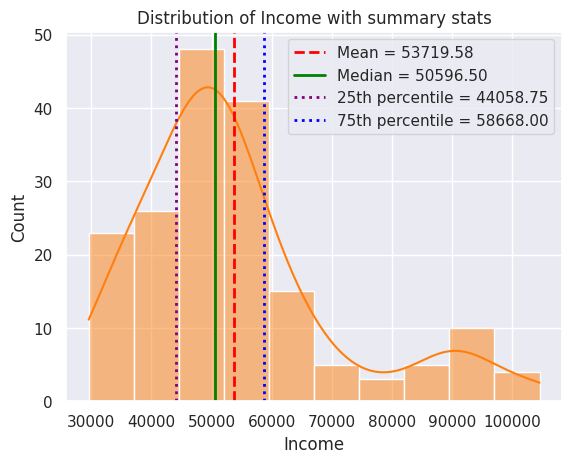

In [ ]:
col='Income'
sns.histplot(data=df, x=col, bins=10, kde=True)
plt.axvline(df[col].mean(), color='red', linestyle='--', linewidth=2, label=f"Mean = {df[col].mean():.2f}")
plt.axvline(df[col].median(), color='green', linestyle='-', linewidth=2, label=f"Median = {df[col].median():.2f}")
plt.axvline(df[col].quantile(0.25), color='purple', linestyle=':', linewidth=2, label=f"25th percentile = {df[col].quantile(0.25):.2f}")
plt.axvline(df[col].quantile(0.75), color='blue', linestyle=':', linewidth=2, label=f"75th percentile = {df[col].quantile(0.75):.2f}")
plt.legend()
plt.title(f"Distribution of {col} with summary stats")
plt.show()

In [ ]:
df['Income'].describe()

,Income
count,180.000000
mean,53719.577778
std,16506.684226
min,29562.000000
25%,44058.750000
50%,50596.500000
75%,58668.000000
max,104581.000000


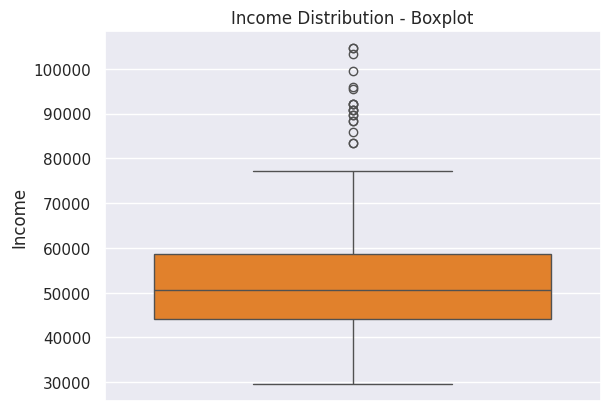

In [ ]:
sns.boxplot(y=df['Income'])
plt.title("Income Distribution - Boxplot")
plt.show()

Most incomes fall between 44K – 59K → strong middle-class cluster.

Mean (53.7K) is slightly higher than the median (50.6K) → distribution is right-skewed (pulled up by a few high-income outliers).

Outliers → some users earn above 100K, significantly higher than typical customers.

Target Market → bulk of customers are in the 40K–60K range → middle-income professionals.

In [ ]:
bins = [0, 44000, 70000, float("inf")]
labels = ["Budget", "Mid", "Affluent"]
df["Income_Category"] = pd.cut(df["Income"], bins=bins, labels=labels, include_lowest=True)
df["Income_Category"].value_counts()

,count
Income_Category,
Mid,112
Budget,45
Affluent,23


In [ ]:
df['Income_Category'].value_counts(normalize=True)*100

,proportion
Income_Category,
Mid,62.222222
Budget,25.000000
Affluent,12.777778


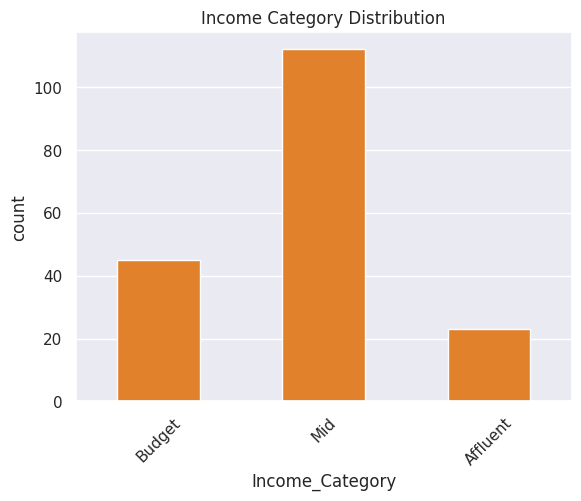

In [ ]:
sns.countplot(x = df["Income_Category"], width=0.5)
plt.xticks(rotation=45)
plt.title("Income Category Distribution")
plt.show()

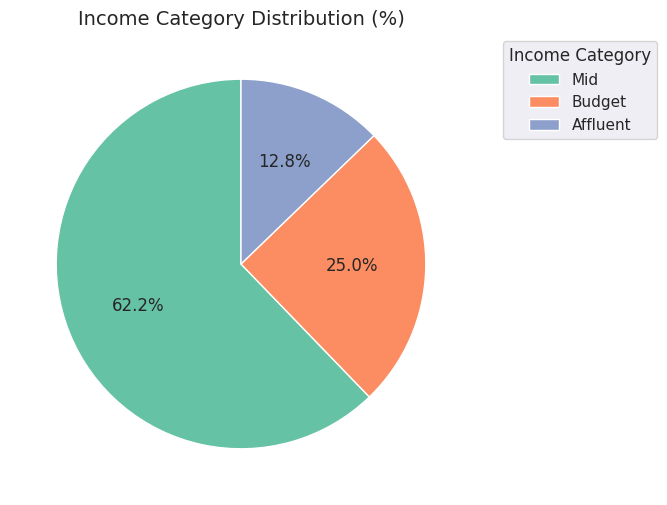

In [ ]:
income_prop = df['Income_Category'].value_counts(normalize=True) * 100

plt.figure(figsize=(6,6))
plt.pie(
    income_prop,
    autopct='%1.1f%%',
    startangle=90,
    colors=plt.cm.Set2.colors
)

plt.legend(
    income_prop.index,
    title="Income Category",
    bbox_to_anchor=(1.05, 1),
    loc="upper left"
)

plt.title("Income Category Distribution (%)", fontsize=14)
plt.show()


###*Miles*

In [ ]:
df['Miles'].min(), df['Miles'].max()

(21, 360)

In [ ]:
df['Miles'].describe()

,Miles
count,180.000000
mean,103.194444
std,51.863605
min,21.000000
25%,66.000000
50%,94.000000
75%,114.750000
max,360.000000


Average usage is ~103 miles

Customers on average run/walk ~100 miles, which is quite high — suggests serious/regular fitness users, not casual.

Wide variation (std ≈ 52 miles)

Some customers use the treadmill lightly (~20–60 miles), while others push it heavily (200+ miles).

Indicates different user personas: casual vs committed.

Median (94) < Mean (103)

Slight right skew: A few very high-mileage users (max = 360) are pulling the average up.

These are likely athletes or fitness enthusiasts.

Quartile breakdown:

25% of users do ≤66 miles → light users.

50% of users do ≤94 miles → average/moderate users.

75% of users do ≤115 miles → heavy users.

Top 25% are super users, going beyond 115 miles.

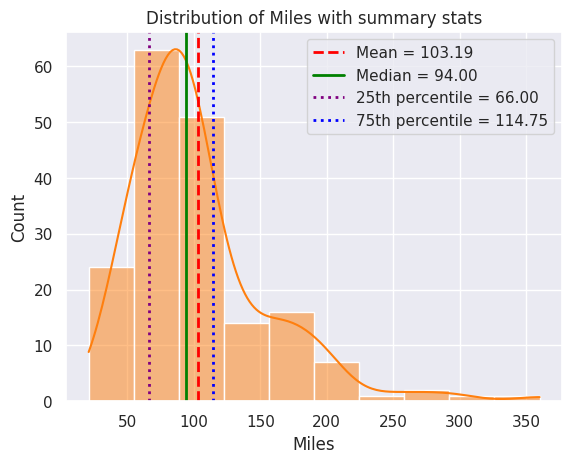

In [ ]:
col='Miles'
sns.histplot(data=df, x=col, bins=10, kde=True)
plt.axvline(df[col].mean(), color='red', linestyle='--', linewidth=2, label=f"Mean = {df[col].mean():.2f}")
plt.axvline(df[col].median(), color='green', linestyle='-', linewidth=2, label=f"Median = {df[col].median():.2f}")
plt.axvline(df[col].quantile(0.25), color='purple', linestyle=':', linewidth=2, label=f"25th percentile = {df[col].quantile(0.25):.2f}")
plt.axvline(df[col].quantile(0.75), color='blue', linestyle=':', linewidth=2, label=f"75th percentile = {df[col].quantile(0.75):.2f}")
plt.legend()
plt.title(f"Distribution of {col} with summary stats")
plt.show()

In [ ]:
bins=[0,70,110,150,360]
labels=['Light','Average','Heavy','Super']
df['Miles_Group']=pd.cut(df['Miles'],bins=bins,labels=labels,include_lowest=True)

In [ ]:
df['Miles_Group'].value_counts(normalize=True)*100

,proportion
Miles_Group,
Average,44.444444
Light,25.555556
Super,15.555556
Heavy,14.444444


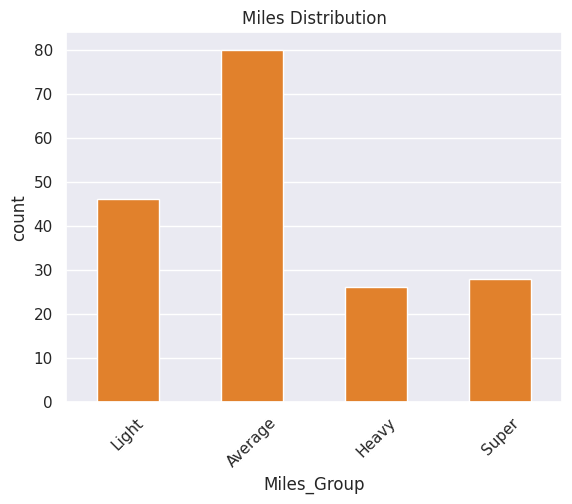

In [ ]:
sns.countplot(x = df["Miles_Group"], width=0.5)
plt.xticks(rotation=45)
plt.title("Miles Distribution")
plt.show()

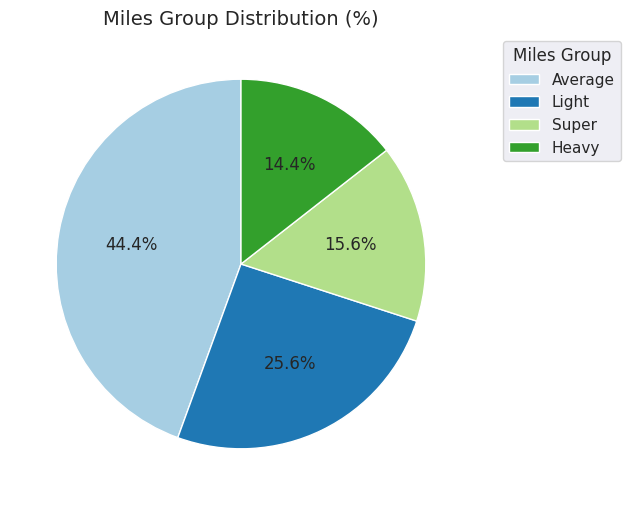

In [ ]:
miles_prop = df['Miles_Group'].value_counts(normalize=True) * 100

plt.figure(figsize=(6,6))
plt.pie(
    miles_prop,
    autopct='%1.1f%%',
    startangle=90,
    colors=plt.cm.Paired.colors
)

plt.legend(
    miles_prop.index,
    title="Miles Group",
    bbox_to_anchor=(1.05, 1),
    loc="upper left"
)

plt.title("Miles Group Distribution (%)", fontsize=14)
plt.show()


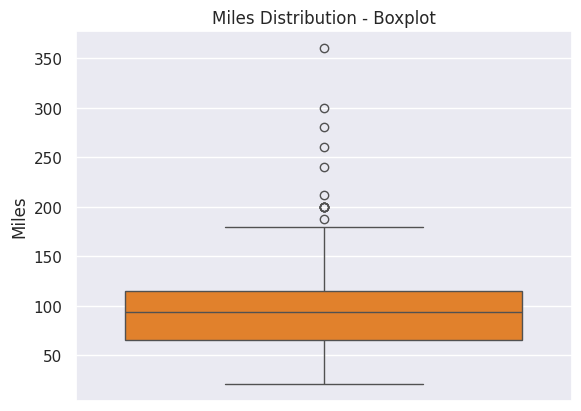

In [ ]:
sns.boxplot(y=df['Miles'])
plt.title("Miles Distribution - Boxplot")
plt.show()

#Outliers Detection And Handling

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 180 entries, 0 to 179
Data columns (total 15 columns):
 #   Column            Non-Null Count  Dtype   
---  ------            --------------  -----   
 0   Product           180 non-null    object  
 1   Age               180 non-null    int64   
 2   Gender            180 non-null    object  
 3   Education         180 non-null    int64   
 4   MaritalStatus     180 non-null    object  
 5   Usage             180 non-null    int64   
 6   Fitness           180 non-null    int64   
 7   Income            180 non-null    int64   
 8   Miles             180 non-null    int64   
 9   Age_Group         180 non-null    category
 10  Education_Level   180 non-null    object  
 11  Usage_Category    180 non-null    category
 12  Fitness_Category  180 non-null    category
 13  Income_Category   180 non-null    category
 14  Miles_Group       180 non-null    category
dtypes: category(5), int64(6), object(4)
memory usage: 15.9+ KB


In [ ]:
num_cols = df.select_dtypes(include=['int64']).columns
num_cols

Index(['Age', 'Education', 'Usage', 'Fitness', 'Income', 'Miles'], dtype='object')

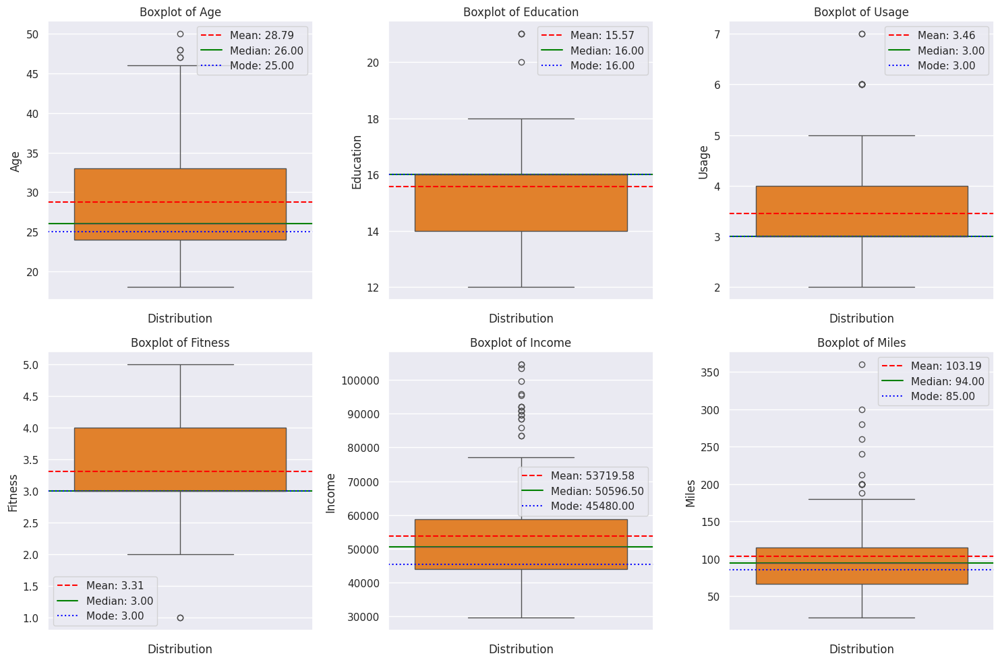

In [ ]:
n_cols = 3
n_rows = 2

plt.figure(figsize=(15, 5 * n_rows))

for i, col in enumerate(num_cols, 1):
    plt.subplot(n_rows, n_cols, i)
    sns.boxplot(y=df[col])

    # Mean, Median, Mode lines
    mean_val = df[col].mean()
    median_val = df[col].median()
    mode_val = df[col].mode()[0]

    plt.axhline(mean_val, color='red', linestyle='--', label=f"Mean: {mean_val:.2f}")
    plt.axhline(median_val, color='green', linestyle='-', label=f"Median: {median_val:.2f}")
    plt.axhline(mode_val, color='blue', linestyle=':', label=f"Mode: {mode_val:.2f}")

    plt.title(f"Boxplot of {col}")
    plt.xlabel("Distribution")
    plt.ylabel(col)
    plt.legend()

plt.tight_layout()
plt.show()

In this dataset 'Income','Miles' have significant number of outliers while other columns have very less or no outliers

In [ ]:
def detect_outliers_iqr(df):
    outlier_info = {}
    num_cols = df.select_dtypes(include=['int64', 'float64']).columns

    for col in num_cols:
        Q1 = df[col].quantile(0.25)
        Q3 = df[col].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR

        outliers = df[(df[col] < lower_bound) | (df[col] > upper_bound)][col]
        outlier_info[col] = {
            "outlier_count": outliers.shape[0],
            "lower_bound": lower_bound,
            "upper_bound": upper_bound,
            "min_value": df[col].min(),
            "max_value": df[col].max(),
            "possible_errors": df[(df[col] < 0) & (df[col].dtype in ['int64','float64'])][col].tolist()
        }
    return outlier_info

outlier_summary = detect_outliers_iqr(df)
pd.DataFrame(outlier_summary).T


,outlier_count,lower_bound,upper_bound,min_value,max_value,possible_errors
Age,5,10.5,46.5,18,50,[]
Education,4,11.0,19.0,12,21,[]
Usage,9,1.5,5.5,2,7,[]
Fitness,2,1.5,5.5,1,5,[]
Income,19,22144.875,80581.875,29562,104581,[]
Miles,13,-7.125,187.875,21,360,[]


In [ ]:
rules = {
    "Age": (0, 100),
    "Income": (1000, 200000),
    "Miles": (0, 1000),
    "Education": (5, 25)
}

def flag_errors(df, rules):
    flagged = {}
    for col, (low, high) in rules.items():
        if col in df.columns:
            errors = df[(df[col] < low) | (df[col] > high)][col]
            flagged[col] = errors.tolist()
    return flagged

flagged_errors = flag_errors(df, rules)
flagged_errors

{'Age': [], 'Income': [], 'Miles': [], 'Education': []}

**There are some outliers, but they may provide many insights for high-end models that can benefit companies more.**

**They represent real-world variation (e.g., income, age, height — some extreme values are natural). Business insights depend on them (e.g., high-spending customers, athletes, luxury buyers).**

**And also there are no data entry errors in these outliers and thats why no treatment needed.**


##Bi-variate Analysis

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 180 entries, 0 to 179
Data columns (total 15 columns):
 #   Column            Non-Null Count  Dtype   
---  ------            --------------  -----   
 0   Product           180 non-null    object  
 1   Age               180 non-null    int64   
 2   Gender            180 non-null    object  
 3   Education         180 non-null    int64   
 4   MaritalStatus     180 non-null    object  
 5   Usage             180 non-null    int64   
 6   Fitness           180 non-null    int64   
 7   Income            180 non-null    int64   
 8   Miles             180 non-null    int64   
 9   Age_Group         180 non-null    category
 10  Education_Level   180 non-null    object  
 11  Usage_Category    180 non-null    category
 12  Fitness_Category  180 non-null    category
 13  Income_Category   180 non-null    category
 14  Miles_Group       180 non-null    category
dtypes: category(5), int64(6), object(4)
memory usage: 15.9+ KB


In [ ]:
num_cols=df.select_dtypes(include=['int64', 'float64']).columns
cat_cols=df.select_dtypes(include=['object','category']).columns
print(num_cols)
print(cat_cols)

Index(['Age', 'Education', 'Usage', 'Fitness', 'Income', 'Miles'], dtype='object')
Index(['Product', 'Gender', 'MaritalStatus', 'Age_Group', 'Education_Level',
       'Usage_Category', 'Fitness_Category', 'Income_Category', 'Miles_Group'],
      dtype='object')


###*Numerical-Numerical*

In [ ]:
df[num_cols].corr()

,Age,Education,Usage,Fitness,Income,Miles
Age,1.000000,0.280496,0.015064,0.061105,0.513414,0.036618
Education,0.280496,1.000000,0.395155,0.410581,0.625827,0.307284
Usage,0.015064,0.395155,1.000000,0.668606,0.519537,0.759130
Fitness,0.061105,0.410581,0.668606,1.000000,0.535005,0.785702
Income,0.513414,0.625827,0.519537,0.535005,1.000000,0.543473
Miles,0.036618,0.307284,0.759130,0.785702,0.543473,1.000000


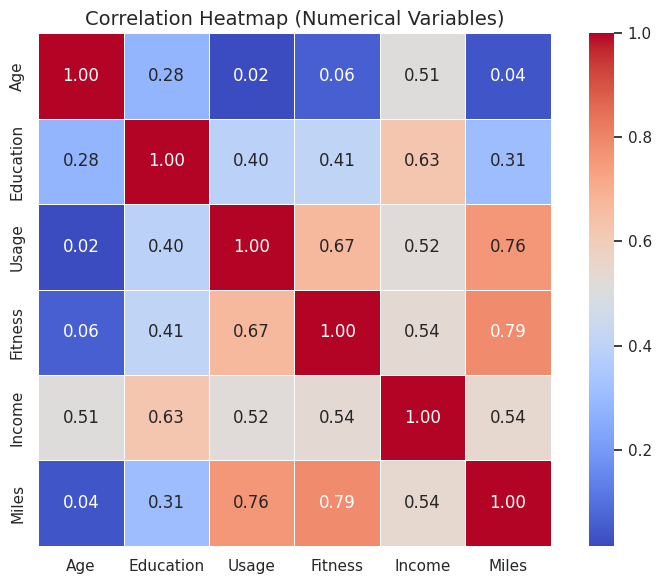

In [ ]:
corr = df[num_cols].corr()
plt.figure(figsize=(8,6))
sns.heatmap(corr, annot=True, fmt=".2f", cmap="coolwarm", cbar=True, square=True,
            linewidths=0.5, linecolor="white")
plt.title("Correlation Heatmap (Numerical Variables)", fontsize=14)
plt.tight_layout()
plt.show()

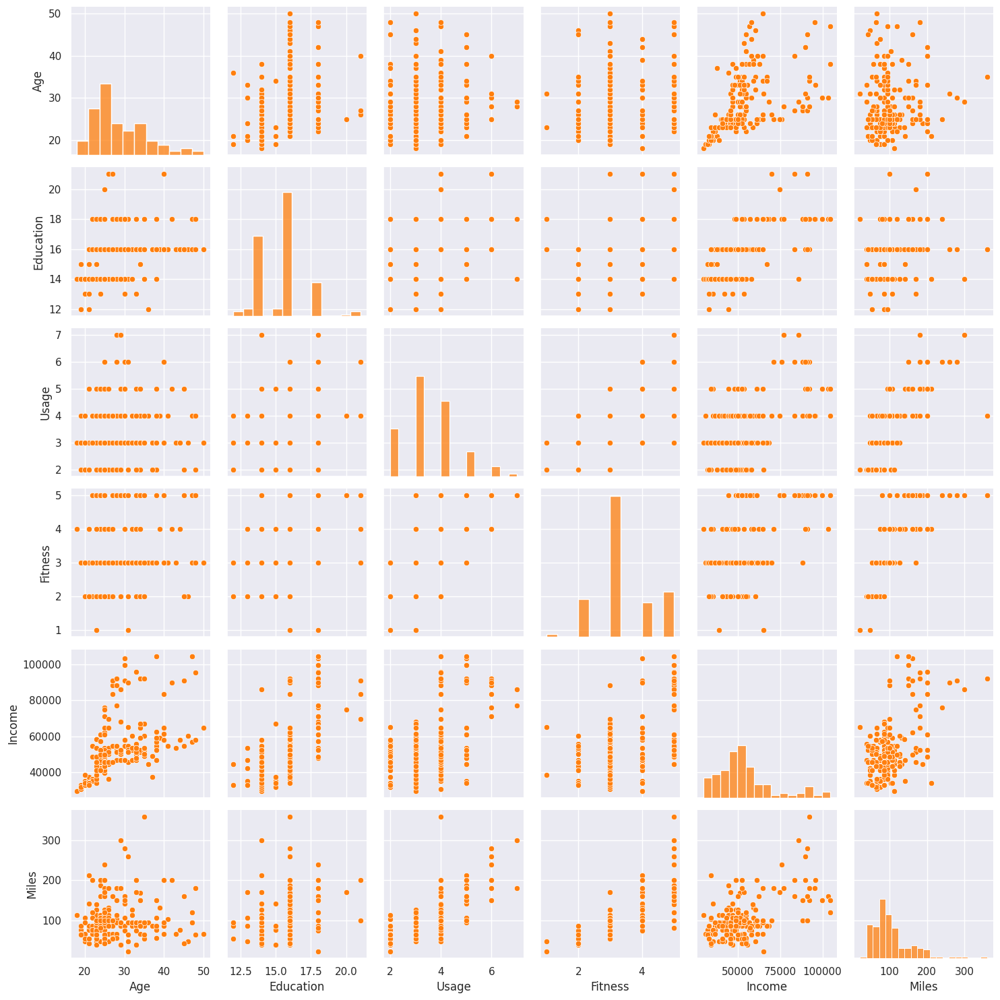

In [ ]:
g=sns.pairplot(df, vars=num_cols)
plt.tight_layout()
plt.show()

Customer Lifestyle Patterns
Fitness, Usage, and Miles are strongly interrelated (Fitness-Miles: 0.79, Usage-Fitness: 0.67, Usage-Miles: 0.76). Targeting customers with high usage or fitness levels with travel, mileage, or performance products and personalized promotions will likely be effective.

The close links suggest bundling active lifestyle products (such as fitness trackers, premium gym services, or distance challenges) will resonate with this audience.

Income and Education Influence
Education-Income correlation (0.63) indicates that promotions for premium or advanced products should focus on more educated segments, as they often have higher spending ability.

Income is also reasonably correlated to Usage, Fitness, and Miles (all above 0.5), supporting targeted upselling of higher-value memberships or add-ons to wealthier clientele.

Market Segmentation & Personalization
Age shows low correlation with Usage, Fitness, and Miles (all below 0.07), implying that active and high-usage customers are found across age groups. Marketing segmentation should focus more on lifestyle and engagement than demographic age.

Education is moderately linked to Usage, Fitness, and Miles (0.31–0.41), suggesting that slightly more educated users may be more engaged—but education alone is not a strong discriminator.

Business Recommendations
Bundle and upsell: Combine services/products for customers showing high fitness and usage for increased engagement and sales.

Premium offerings: Direct high-end or innovative products to the wealthier, highly educated segments for optimal conversion.

Inclusive campaigns: Age should not be a major factor when designing marketing campaigns for usage or fitness products, as motivation spans generations.

###*Categorical-Numerical*

In [ ]:
print(num_cols)
print(cat_cols)

Index(['Age', 'Education', 'Usage', 'Fitness', 'Income', 'Miles'], dtype='object')
Index(['Product', 'Gender', 'MaritalStatus', 'Age_Group', 'Education_Level',
       'Usage_Category', 'Fitness_Category', 'Income_Category', 'Miles_Group'],
      dtype='object')


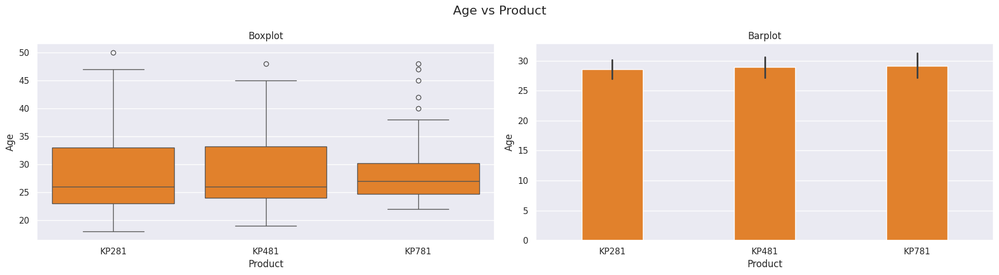

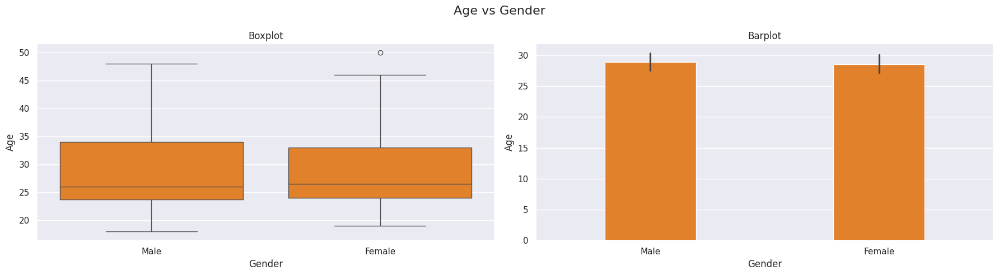

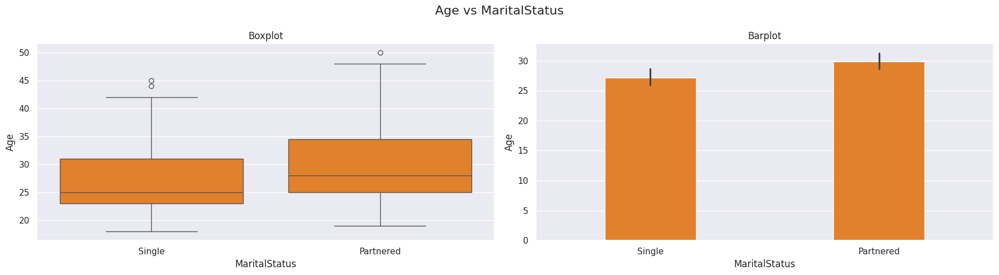

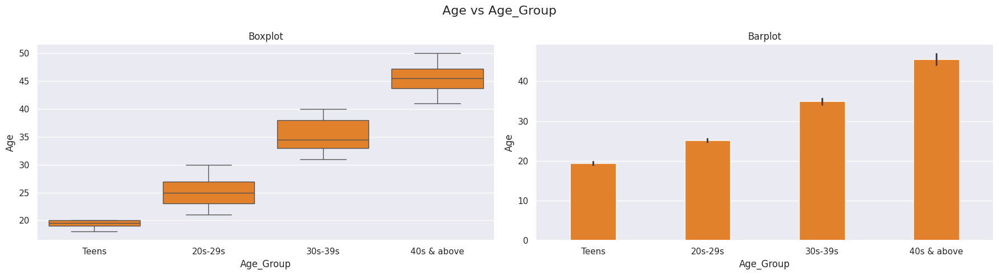

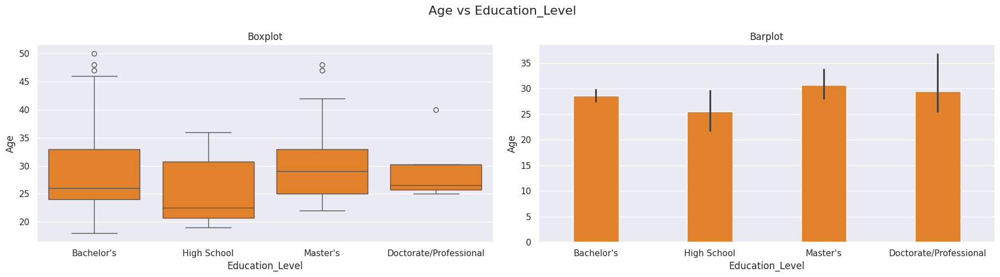

...

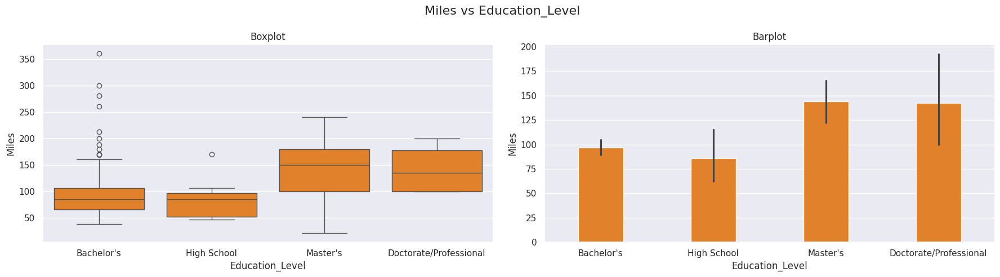

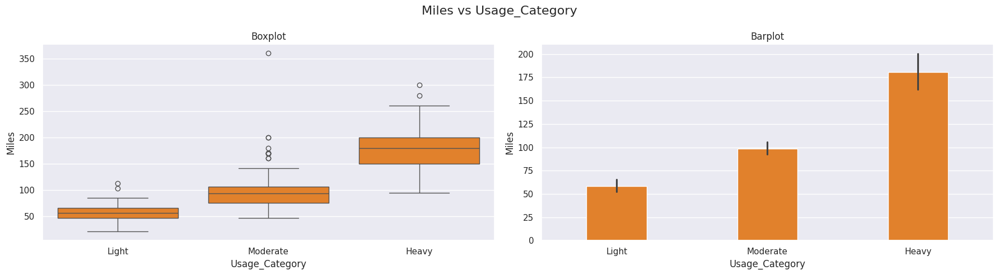

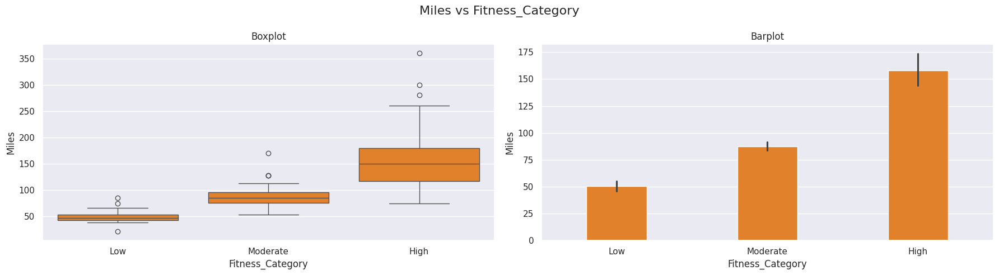

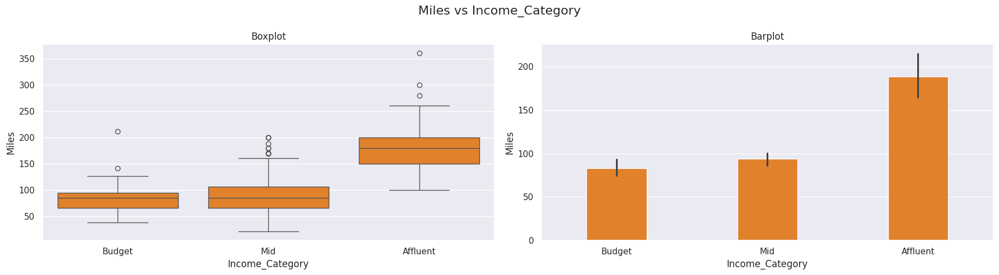

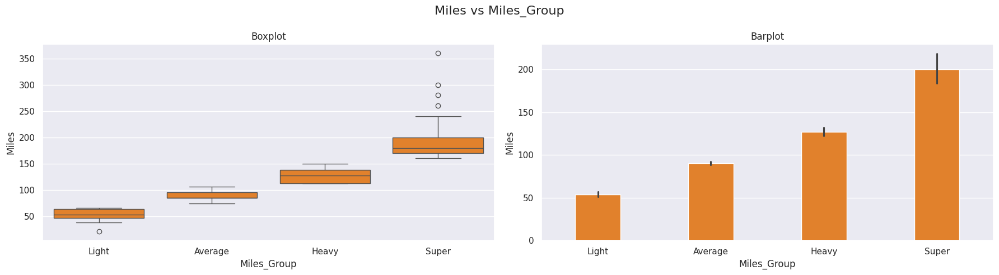

In [ ]:
for num in num_cols:
    for cat in cat_cols:
        fig, axes = plt.subplots(1, 2, figsize=(18, 5))
        fig.suptitle(f"{num} vs {cat}", fontsize=16)

        # Boxplot
        sns.boxplot(data=df, x=cat, y=num, ax=axes[0])
        axes[0].set_title("Boxplot")

        # Barplot
        sns.barplot(data=df, x=cat, y=num, estimator="mean", ax=axes[1],width=0.4)
        axes[1].set_title("Barplot")

        plt.tight_layout()
        plt.show()

###*Categorical-Categorical*

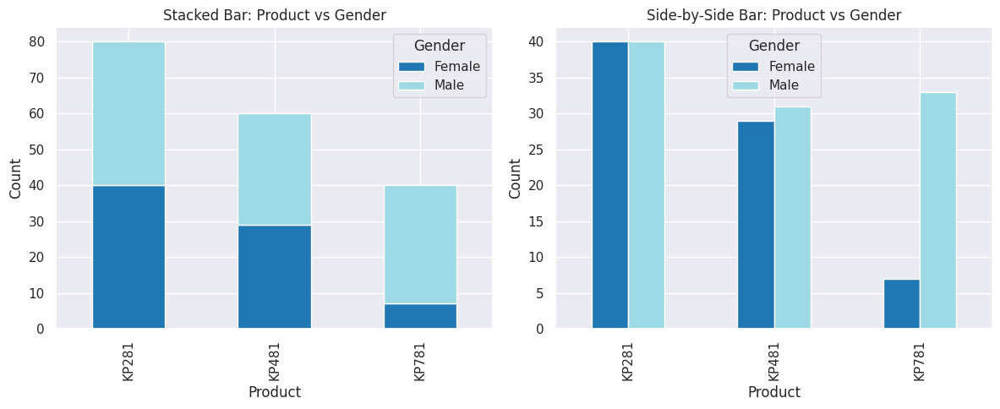

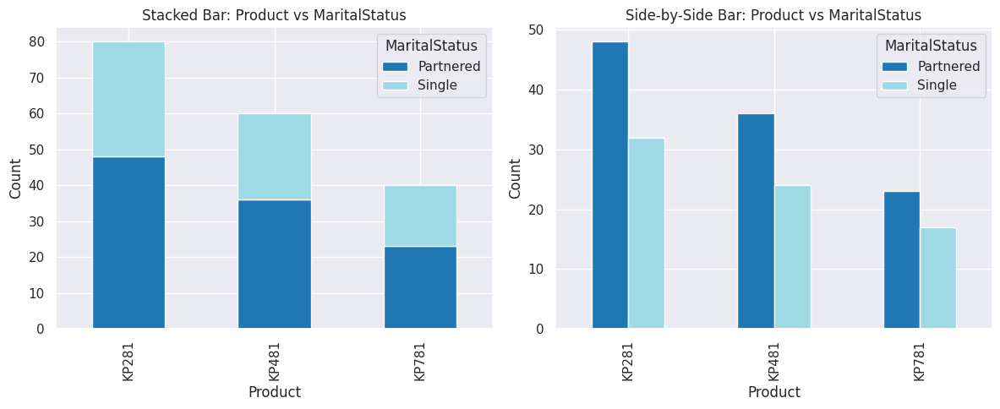

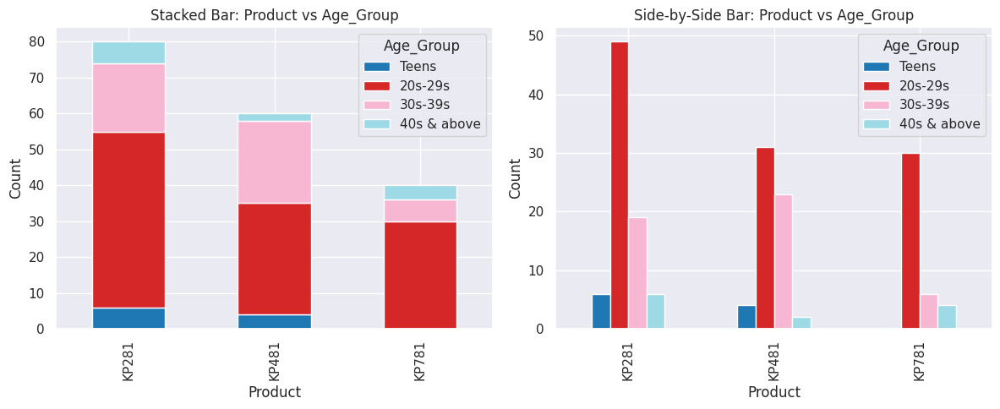

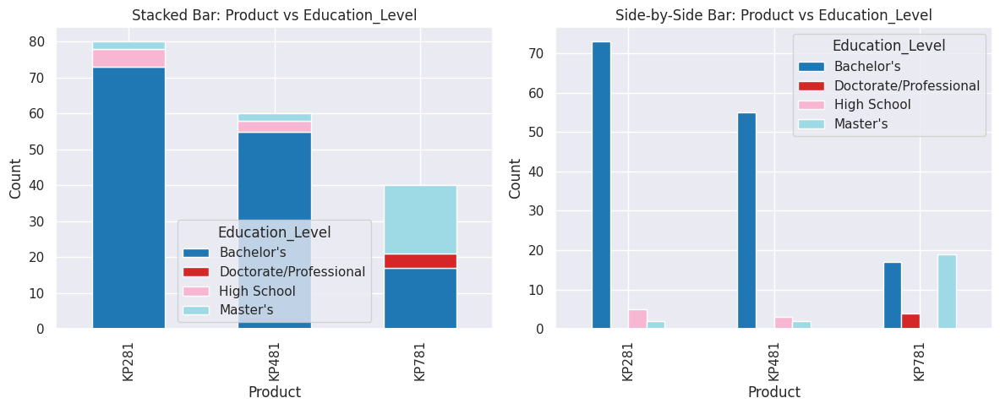

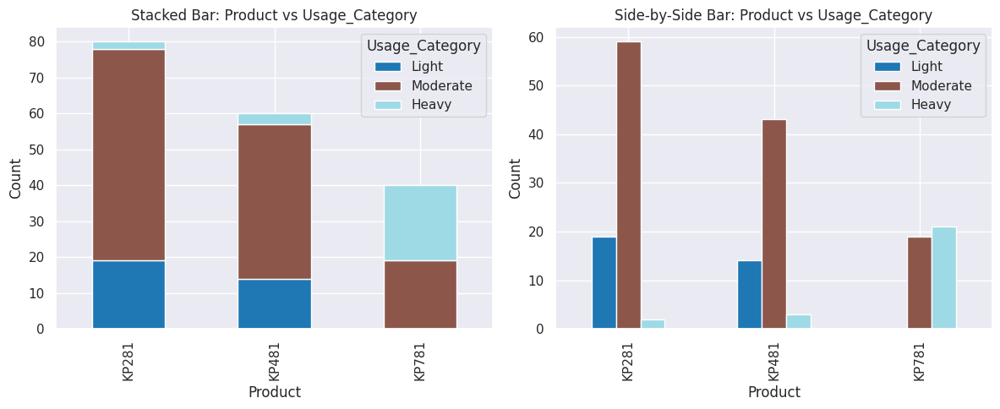

...

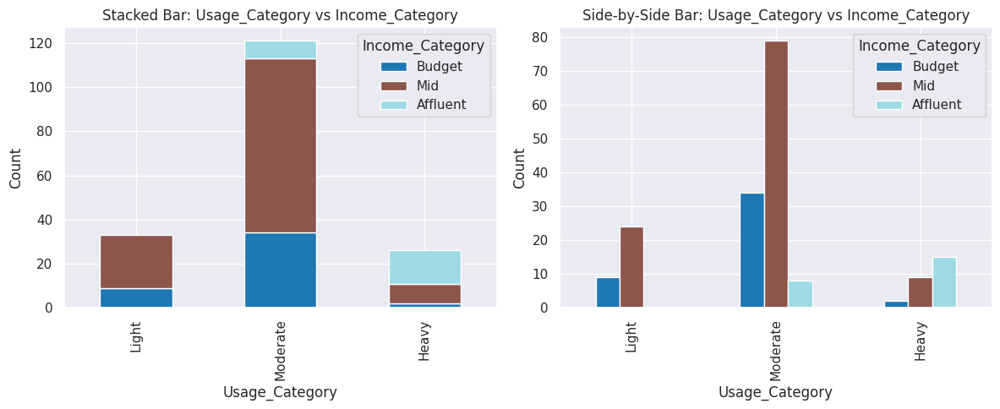

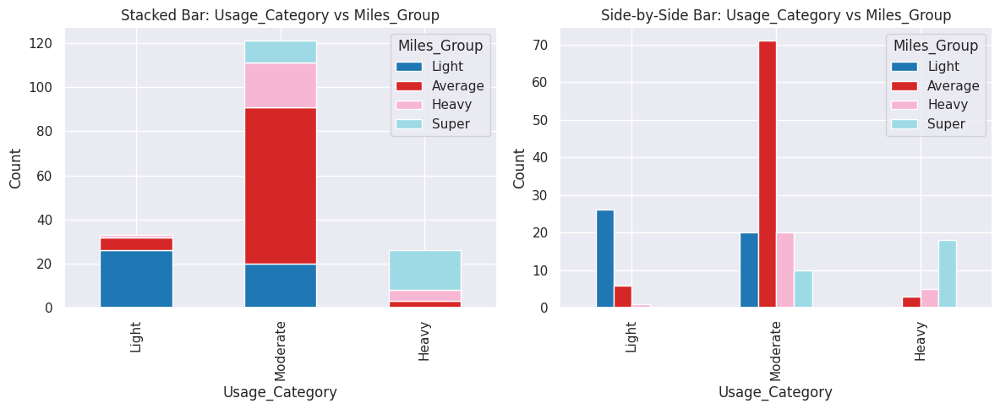

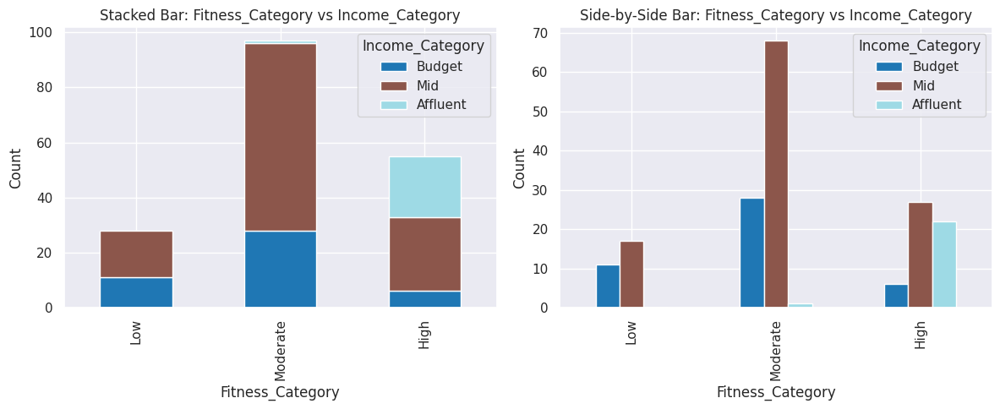

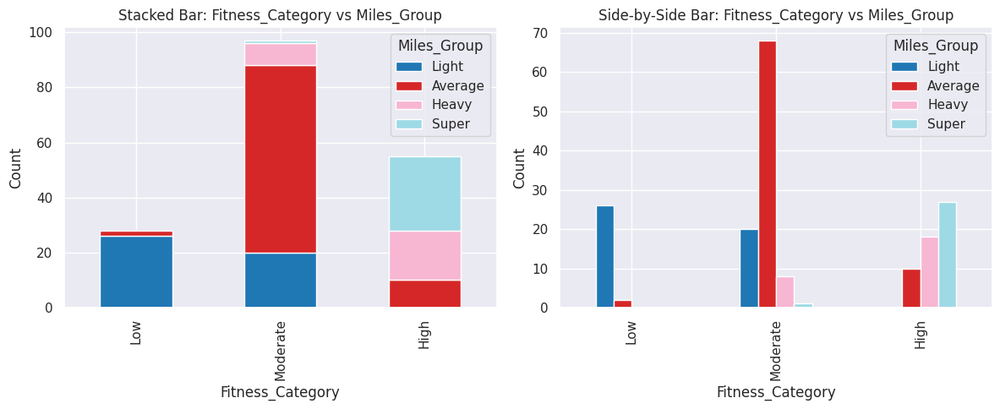

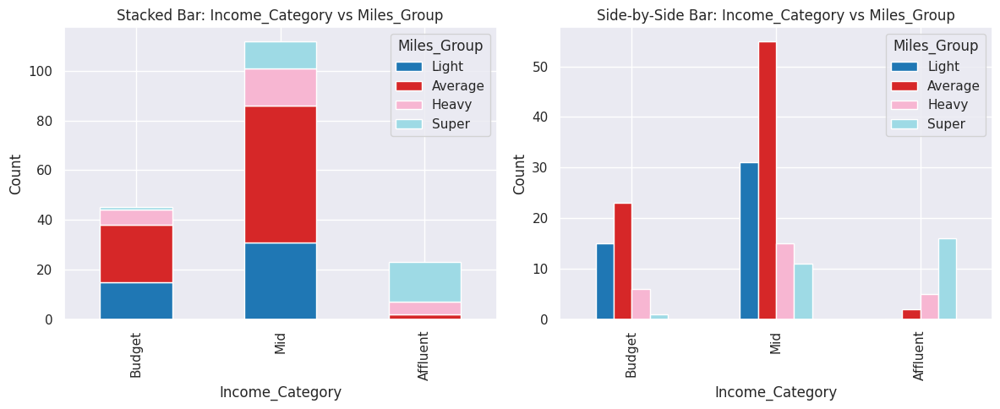

In [ ]:
for i in range(len(cat_cols)):
    for j in range(i+1, len(cat_cols)):
        col1, col2 = cat_cols[i], cat_cols[j]
        ct = pd.crosstab(df[col1], df[col2])

        fig, axes = plt.subplots(1, 2, figsize=(12, 5))


        ct.plot(kind='bar', stacked=True, ax=axes[0], colormap="tab20")
        axes[0].set_title(f"Stacked Bar: {col1} vs {col2}")
        axes[0].set_ylabel("Count")


        ct.plot(kind='bar', stacked=False, ax=axes[1], colormap="tab20")
        axes[1].set_title(f"Side-by-Side Bar: {col1} vs {col2}")
        axes[1].set_ylabel("Count")

        plt.tight_layout()
        plt.show()

##Multivariate Analysis

In [ ]:
num_cols

Index(['Age', 'Education', 'Usage', 'Fitness', 'Income', 'Miles'], dtype='object')

In [ ]:
cat_cols

Index(['Product', 'Gender', 'MaritalStatus', 'Age_Group', 'Education_Level',
       'Usage_Category', 'Fitness_Category', 'Income_Category', 'Miles_Group'],
      dtype='object')

###*Cat-Cat-Num*

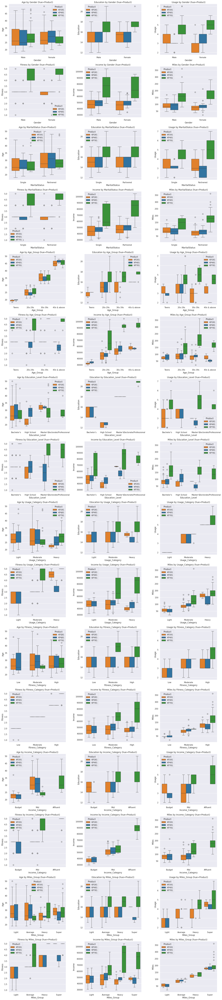

In [ ]:
# total number of plots
total_plots = len(cat_cols[1:]) * len(num_cols)
cols = 3
rows = math.ceil(total_plots / cols)

fig, axes = plt.subplots(rows, cols, figsize=(18, rows * 5))
axes = axes.flatten()  # make it 1D for easy indexing

plot_idx = 0
for i in cat_cols[1:]:
    for j in num_cols:
        ax = axes[plot_idx]
        sns.boxplot(data=df, x=i, y=j, hue='Product', ax=ax)
        ax.set_title(f"{j} by {i} (hue=Product)")
        ax.set_xlabel(i)
        ax.set_ylabel(j)
        plot_idx += 1

# Hide unused subplots if any
for k in range(plot_idx, len(axes)):
    fig.delaxes(axes[k])

plt.tight_layout()
plt.show()


###*Num-Num-Num*

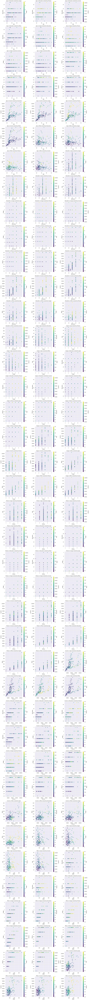

In [ ]:


# all triplets of numerical columns
triplets = list(itertools.permutations(num_cols, 3))

# plot setup
cols = 3
rows = math.ceil(len(triplets) / cols)

fig, axes = plt.subplots(rows, cols, figsize=(18, 5 * rows))
axes = axes.flatten()

for idx, (x, y, color) in enumerate(triplets):
    ax = axes[idx]
    sc = ax.scatter(df[x], df[y], c=df[color], cmap="viridis", alpha=0.7)
    ax.set_xlabel(x)
    ax.set_ylabel(y)
    ax.set_title(f"{x} vs {y} (colored by {color})")

    # add colorbar for each plot
    cbar = plt.colorbar(sc, ax=ax)
    cbar.set_label(color)

# remove extra subplots
for k in range(len(triplets), len(axes)):
    fig.delaxes(axes[k])

plt.tight_layout()
plt.show()


###*Num-Num-Cat*

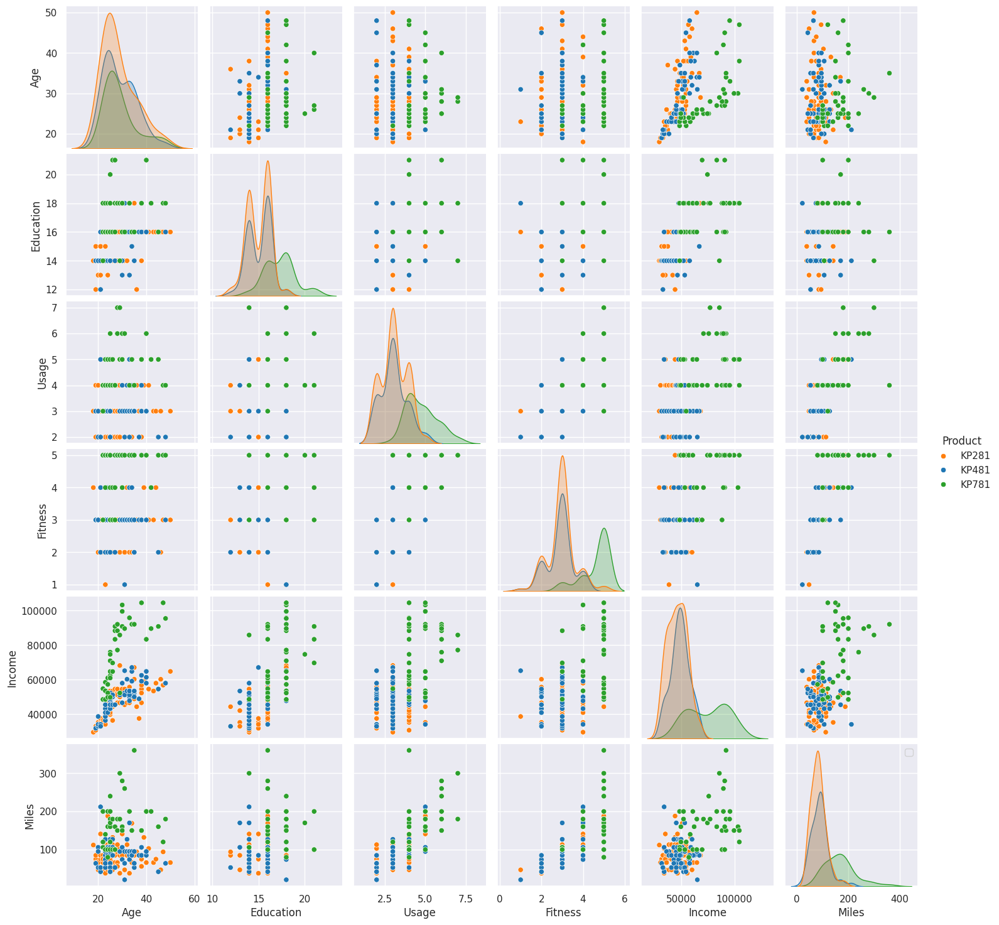

In [ ]:
sns.pairplot(df, hue='Product')
plt.legend()
plt.show()

#Analysis using Crosstab
Marginal Probabilities, Joint Probabilities, Conditional Probabilities

##Product-Age_Group

In [ ]:
pd.crosstab(df['Product'],df['Age_Group'],margins=True)

Age_Group,Teens,20s-29s,30s-39s,40s & above,All
Product,,,,,
KP281,6,49,19,6,80
KP481,4,31,23,2,60
KP781,0,30,6,4,40
All,10,110,48,12,180




> What is the probability that a randomly chosen customer is aged between 20s-29s?



In [ ]:
110/180

0.6111111111111112



> What is the probability that a randomly chosen customer is aged above 30?



In [ ]:
60/180

0.3333333333333333



> What is the probability that a customer purchased KP281,KP481 and KP781?





In [ ]:
80/180,60/180,40/180

(0.4444444444444444, 0.3333333333333333, 0.2222222222222222)



> What is the probability that a customer is in 30s–39s and purchased KP481?



In [ ]:
23/180

0.12777777777777777



> Given that a customer is in the 20s–29s, what is the probability they purchased KP281?



In [ ]:
49/110

0.44545454545454544



> Given that a customer is in 40s & above, what is the probability they purchased KP781?



In [ ]:
4/12

0.3333333333333333



> Given that a customer purchased KP481, what is the probability they are in 20s–29s?



In [ ]:
31/60

0.5166666666666667



> Among customers in 30s–39s, what is the probability they purchased KP481?



In [ ]:
23/48

0.4791666666666667

##Product-Education_Level

In [ ]:
pd.crosstab(df['Product'],df['Education_Level'],margins=True)

Education_Level,Bachelor's,Doctorate/Professional,High School,Master's,All
Product,,,,,
KP281,73,0,5,2,80
KP481,55,0,3,2,60
KP781,17,4,0,19,40
All,145,4,8,23,180




> What proportion of customers have a Bachelor’s degree?



In [ ]:
(145/180)*100

80.55555555555556



> What is the probability that a randomly chosen customer purchased KP781?



In [ ]:
40/180

0.2222222222222222



> What is the probability that a customer has a Master’s degree and purchased KP781?



In [ ]:
19/180

0.10555555555555556



> What is the probability that a customer has a Doctorate and purchased KP781?



In [ ]:
4/180

0.022222222222222223



> Given that a customer purchased KP281, what is the probability they have a Bachelor’s degree?



In [ ]:
73/80

0.9125



> Given that a customer purchased KP481, what is the probability they have a Bachelor’s degree?



In [ ]:
55/60

0.9166666666666666



> Given that a customer purchased KP781, what is the probability they have a Master’s degree?



In [ ]:
19/40

0.475



> Among Doctorates, what is the probability they purchased KP781?



In [ ]:
4/4

1.0



> Among High School customers, what is the probability they purchased KP281?



In [ ]:
5/8

0.625

Business Insights:

KP281 & KP481 → ~91% buyers are Bachelor’s holders → Products are mainstream, should be priced and marketed broadly.

KP781 → Appeals to higher-educated groups (Master’s + Doctorates = 57.5%) → Position as a premium / specialized product.

High School customers lean toward KP281 → product seen as more affordable/accessible.

Doctorates ONLY buy KP781 → suggests elite product positioning.

##Product-MaritalStatus

In [ ]:
pd.crosstab(df['Product'],df['MaritalStatus'],margins=True)

MaritalStatus,Partnered,Single,All
Product,,,
KP281,48,32,80
KP481,36,24,60
KP781,23,17,40
All,107,73,180




> Probability that a randomly selected customer is Partnered:



In [ ]:
107/180

0.5944444444444444



> Probability that a customer is Single and bought KP781:



In [ ]:
17/180

0.09444444444444444



> Given a customer bought KP281, probability they are Partnered:




In [ ]:
48/80

0.6



> Given a customer bought KP481, probability they are Partnered:




In [ ]:
36/60

0.6

> Given a customer bought KP781, probability they are Partnered:


In [ ]:
23/40

0.575

KP281: 60% Partnered, 40% Single

KP481: 60% Partnered, 40% Single

KP781: 57.5% Partnered, 42.5% Single

All products lean more toward Partnered customers.
But relatively speaking, KP781 has the highest proportion of Singles among the three.

Singles are still more likely to buy KP781 than other products, but Partnered remain the majority in every product category.

KP281 & KP481 → equally split at 60% Partnered vs 40% Single → both products appeal across relationship statuses, leaning toward couples.

KP781 → has a higher proportion of Singles (42.5%) compared to its market share → suggests KP781 may appeal to more independent / premium buyers.

Market is Partnered-majority (59.4%), but Singles form a big niche (40.6%) → brands can tailor KP781 ads toward singles (self-reward, independence) while positioning KP281/KP481 toward families/couples.

##Product-Usage_Category

In [ ]:
pd.crosstab(df['Product'],df['Usage_Category'],margins=True)

Usage_Category,Light,Moderate,Heavy,All
Product,,,,
KP281,19,59,2,80
KP481,14,43,3,60
KP781,0,19,21,40
All,33,121,26,180


**KP281**

Light: 23.8% (19/80)

Moderate: 73.8% (59/80)

Heavy: 2.5% (2/80)

*-Clear Moderate-use product, appealing to steady but not extreme users.*

**KP481**

Light: 23.3% (14/60)

Moderate: 71.7% (43/60)

Heavy: 5% (3/60)

*-Very similar to KP281, again a Moderate-use product.*

**KP781**

Light: 0% (0/40)

Moderate: 47.5% (19/40)

Heavy: 52.5% (21/40)

*-The only product with majority Heavy users. This stands out as the high-intensity product.*

Business Insights

KP781 dominates Heavy Users → More than half of KP781’s customers are Heavy users.

Suggests it is suited for serious fitness enthusiasts or those using the treadmill extensively.

Could be marketed as a premium, durable, high-performance product.

KP281 & KP481 appeal to Moderates → Both have ~72–74% Moderate users, only a tiny fraction of Heavy.

Likely designed for casual to semi-regular users.

Marketing could focus on reliability and everyday fitness rather than intensity.

No Light users for KP781 → Light users completely avoid KP781, meaning it may be too advanced or expensive for them.

Portfolio positioning →

KP281 & KP481 = Mid-tier, for regular but not extreme usage.

KP781 = Niche, but critical for heavy users (potentially higher lifetime value).

##Product-Fitness

In [ ]:
pd.crosstab(df['Product'],df['Fitness_Category'],margins=True)

Fitness_Category,Low,Moderate,High,All
Product,,,,
KP281,15,54,11,80
KP481,13,39,8,60
KP781,0,4,36,40
All,28,97,55,180


KP281

Low: 18.8% (15/80)

Moderate: 67.5% (54/80)

High: 13.8% (11/80)

-Appeals to moderate fitness level users. Balanced product, good for average customers.

KP481

Low: 21.7% (13/60)

Moderate: 65% (39/60)

High: 13.3% (8/60)

-Almost identical to KP281 → another moderate fitness segment product.

KP781

Low: 0% (0/40)

Moderate: 10% (4/40)

High: 90% (36/40)

-Extremely skewed — almost exclusively High fitness users.

Business Insights

KP781 = High Fitness product

90% of users are High fitness.

Clear signal it’s built for athletes, advanced runners, or serious fitness enthusiasts.

Marketing → premium, performance-driven messaging.

KP281 & KP481 = Moderate Fitness products

Two-thirds of their users fall into the Moderate group.

Cater to average fitness-conscious customers.

Best sold as everyday reliable machines for staying fit.

Low Fitness users

Present only in KP281 & KP481 (19–22%).

These models have entry-level accessibility, attracting beginners too.

No Low Fitness buyers for KP781

Confirms KP781 is not for entry-level. Either price, specs, or positioning keeps casual users away.

Together with the Usage_Category analysis, a strong pattern emerges:

KP781 = Heavy Usage + High Fitness → Premium advanced product.

KP281 & KP481 = Moderate Usage + Moderate Fitness (+ some Low) → Mass-market models.

In [ ]:
pd.crosstab(df['Product'],df['Fitness'],margins=True)

Fitness,1,2,3,4,5,All
Product,,,,,,
KP281,1,14,54,9,2,80
KP481,1,12,39,8,0,60
KP781,0,0,4,7,29,40
All,2,26,97,24,31,180


##Product-Income_Category

In [ ]:
pd.crosstab(df['Product'],df['Income_Category'],margins=True)

Income_Category,Budget,Mid,Affluent,All
Product,,,,
KP281,30,50,0,80
KP481,15,45,0,60
KP781,0,17,23,40
All,45,112,23,180



KP281

Budget: 37.5% (30/80)

Mid: 62.5% (50/80)

Affluent: 0%

- Positioned for budget to mid-income customers. No affluent buyers.


KP481

Budget: 25% (15/60)

Mid: 75% (45/60)

Affluent: 0%

- Skews more towards mid-income buyers compared to KP281.

KP781

Budget: 0%

Mid: 42.5% (17/40)

Affluent: 57.5% (23/40)

- Exclusively mid-to-affluent product; strongest with affluent buyers.

Business Insights

Clear income segmentation:

KP281 & KP481 → Budget + Mid → These are the mass-market models.

KP781 → Mid + Affluent only → The premium product.

No overlap in Affluent buyers:

Affluent users only buy KP781.

Suggests KP781 is positioned and priced for higher-income households.

KP281 vs KP481 subtle difference:

KP281 = relatively more Budget buyers.

KP481 = relatively more Mid-income buyers.

Could indicate tiered positioning: KP281 as entry-level, KP481 as mid-range.

KP781’s exclusivity:

No Budget customers at all.

Ties back with High Fitness & Heavy Usage analysis → only serious and well-off customers buy it.

 Combined with earlier crosstabs:

KP281 → Entry/Mid segment, Budget-friendly, Moderate Fitness, Light/Moderate Usage.

KP481 → Mid segment, Moderate Fitness, Moderate Usage.

KP781 → Affluent, High Fitness, Heavy Usage.

##Product-Miles_Group

In [ ]:
pd.crosstab(df['Product'],df['Miles_Group'],margins=True)

Miles_Group,Light,Average,Heavy,Super,All
Product,,,,,
KP281,28,37,13,2,80
KP481,18,34,5,3,60
KP781,0,9,8,23,40
All,46,80,26,28,180


KP281

Light: 35% (28/80)

Average: 46% (37/80)

Heavy: 16% (13/80)

Super: 3% (2/80)
- Mostly light-to-average users, very few “super” heavy users.

KP481

Light: 30% (18/60)

Average: 57% (34/60)

Heavy: 8% (5/60)

Super: 5% (3/60)
- More concentrated in average users than KP281, slightly more reach in super users.

KP781

Light: 0%

Average: 22.5% (9/40)

Heavy: 20% (8/40)

Super: 57.5% (23/40)
- Dominated by super heavy users. No light users at all.

Business Insights

KP281 → Entry/Mass product

- Majority light-to-average usage.

- Best for casual or fitness-starter customers.

KP481 → Mid-tier, loyal usage

- Strongest with average users.

- Has a few “super” users → shows it’s a reliable product but not the top choice for power-users.

KP781 → Elite / Heavy product

- Majority super users, followed by heavy.

- No light users at all → clearly a serious fitness machine for high-commitment customers.

- Matches affluent + high fitness + heavy usage profile from earlier crosstabs.



---



KP281: Budget to Mid income, Light–Moderate usage, Average miles → entry-level treadmill.

KP481: Mid income, Moderate usage, Average miles → balanced mid-market treadmill.

KP781: Affluent, High fitness, Heavy/Super usage miles → premium/professional treadmill.



---



---

